## 1. Introduction and Dataset Research

Motivation: 
1. Food Regulations: Studying nutrition helps create better food labels, policies, and public health messages;
2. Nutrients: This project helps understand the connection between food and nutrients;
3. Food Similarity: Discovering similar foods helps find healthier options or replacements for diets;

Goal: 
1. Food Similarity: Exploring whether some Food Categories can be classified into 1 cluster;
2. Nutrient Concentrations: Diving deeper and to see if these classified Food Categories in the same cluster indeed have some potential similar Nutrient Concentration between them.

Dataset Information: The following data comes from the United States Department of Agriculture’s Food Composition Database. It contains data for various types of food including the amounts of different vitamins and minerals found in the foods as well as macronutrient percentages. The food covered spans a large variety of foods from butter to Campbell’s soup. Much of the supplementary documenation for each field comes directly from that pages’ Wikipedia article.

In [316]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

from sklearn.mixture import GaussianMixture
from sklearn.metrics import adjusted_rand_score, silhouette_samples, silhouette_score, homogeneity_score, completeness_score, v_measure_score


import warnings

warnings.simplefilter(action='ignore', category=FutureWarning)

from warnings import simplefilter
from sklearn.exceptions import ConvergenceWarning
simplefilter("ignore", category=ConvergenceWarning)

import warnings
warnings.simplefilter("ignore", UserWarning)

## 2. Data Cleaning and Data Manipulation

In [317]:
df = pd.read_csv('food.csv')
df = df.dropna()
df.head()

,Category,Description,Nutrient Data Bank Number,Data.Alpha Carotene,Data.Beta Carotene,Data.Beta Cryptoxanthin,Data.Carbohydrate,Data.Cholesterol,Data.Choline,Data.Fiber,...,Data.Major Minerals.Phosphorus,Data.Major Minerals.Potassium,Data.Major Minerals.Sodium,Data.Major Minerals.Zinc,Data.Vitamins.Vitamin A - RAE,Data.Vitamins.Vitamin B12,Data.Vitamins.Vitamin B6,Data.Vitamins.Vitamin C,Data.Vitamins.Vitamin E,Data.Vitamins.Vitamin K
0,Milk,"Milk, human",11000000,0,7,0,6.89,14,16.0,0.0,...,14,51,17,0.17,61,0.05,0.011,5.0,0.08,0.3
1,Milk,"Milk, NFS",11100000,0,4,0,4.87,8,17.9,0.0,...,103,157,39,0.42,59,0.56,0.060,0.1,0.03,0.2
2,Milk,"Milk, whole",11111000,0,7,0,4.67,12,17.8,0.0,...,101,150,38,0.41,32,0.54,0.061,0.0,0.05,0.3
3,Milk,"Milk, low sodium, whole",11111100,0,7,0,4.46,14,16.0,0.0,...,86,253,3,0.38,29,0.36,0.034,0.9,0.08,0.3
4,Milk,"Milk, calcium fortified, whole",11111150,0,7,0,4.67,12,17.8,0.0,...,101,150,38,0.41,32,0.54,0.061,0.0,0.05,0.3


In [318]:
df = df.drop(columns=["Description", "Nutrient Data Bank Number"])
df.head()

,Category,Data.Alpha Carotene,Data.Beta Carotene,Data.Beta Cryptoxanthin,Data.Carbohydrate,Data.Cholesterol,Data.Choline,Data.Fiber,Data.Lutein and Zeaxanthin,Data.Lycopene,...,Data.Major Minerals.Phosphorus,Data.Major Minerals.Potassium,Data.Major Minerals.Sodium,Data.Major Minerals.Zinc,Data.Vitamins.Vitamin A - RAE,Data.Vitamins.Vitamin B12,Data.Vitamins.Vitamin B6,Data.Vitamins.Vitamin C,Data.Vitamins.Vitamin E,Data.Vitamins.Vitamin K
0,Milk,0,7,0,6.89,14,16.0,0.0,0,0,...,14,51,17,0.17,61,0.05,0.011,5.0,0.08,0.3
1,Milk,0,4,0,4.87,8,17.9,0.0,0,0,...,103,157,39,0.42,59,0.56,0.060,0.1,0.03,0.2
2,Milk,0,7,0,4.67,12,17.8,0.0,0,0,...,101,150,38,0.41,32,0.54,0.061,0.0,0.05,0.3
3,Milk,0,7,0,4.46,14,16.0,0.0,0,0,...,86,253,3,0.38,29,0.36,0.034,0.9,0.08,0.3
4,Milk,0,7,0,4.67,12,17.8,0.0,0,0,...,101,150,38,0.41,32,0.54,0.061,0.0,0.05,0.3


In [319]:
value_counts = df["Category"].value_counts()
print("\nCount of Each Value in 'Category':")
print(value_counts)


Count of Each Value in 'Category':
Infant formula                          173
Rice                                    143
Bread                                   119
Potato                                  105
Cookie                                  100
                                       ... 
Layer dip                                 1
Bean dip                                  1
Refried beans with meat                   1
Black bean salad                          1
Industrial oil as ingredient in food      1
Name: Category, Length: 2429, dtype: int64


we only keep the categories with more than 50 observations

In [320]:
categories_to_keep = value_counts[value_counts > 50].index    #only keep the categories with more than 50 observations
df = df[df["Category"].isin(categories_to_keep)]
df['Category'].unique()

array(['Chocolate milk', 'Infant formula', 'Cheese', 'Beef',
       'Frankfurter or hot dog sandwich', 'Egg omelet or scrambled egg',
       'Bread', 'Cookie', 'Pie', 'Crackers', 'Pasta', 'Rice', 'Potato',
       'Coffee'], dtype=object)

In [321]:
df = df[['Category', 'Data.Protein', 'Data.Major Minerals.Phosphorus', 'Data.Fat.Total Lipid', 'Data.Water', 'Data.Selenium', 'Data.Major Minerals.Sodium', 'Data.Fat.Monosaturated Fat', 'Data.Riboflavin', 'Data.Fat.Saturated Fat', 'Data.Major Minerals.Zinc', 'Data.Major Minerals.Iron', 'Data.Fat.Polysaturated Fat', 'Data.Niacin', 'Data.Vitamins.Vitamin B12', 'Data.Cholesterol']]
df

,Category,Data.Protein,Data.Major Minerals.Phosphorus,Data.Fat.Total Lipid,Data.Water,Data.Selenium,Data.Major Minerals.Sodium,Data.Fat.Monosaturated Fat,Data.Riboflavin,Data.Fat.Saturated Fat,Data.Major Minerals.Zinc,Data.Major Minerals.Iron,Data.Fat.Polysaturated Fat,Data.Niacin,Data.Vitamins.Vitamin B12,Data.Cholesterol
97,Chocolate milk,3.39,101,0.00,82.34,1.9,79,0.000,0.166,0.000,0.41,0.27,0.000,0.164,0.32,2
98,Chocolate milk,3.17,101,3.39,82.30,1.9,60,0.990,0.162,2.104,0.41,0.24,0.124,0.125,0.33,12
99,Chocolate milk,2.99,102,1.90,82.17,3.4,66,0.455,0.183,1.177,0.39,0.24,0.089,0.164,0.33,8
100,Chocolate milk,3.39,101,0.00,82.34,1.9,79,0.000,0.166,0.000,0.41,0.27,0.000,0.164,0.32,2
101,Chocolate milk,3.46,96,1.11,84.50,1.9,65,0.300,0.247,0.616,0.43,0.23,0.049,0.124,0.23,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6740,Coffee,9.00,451,13.21,3.10,4.0,500,0.954,0.109,11.376,1.01,3.06,0.349,4.655,0.00,0
6741,Coffee,2.40,136,11.29,1.41,1.9,47,3.294,0.020,6.453,0.07,0.68,0.162,3.622,0.00,0
6742,Coffee,0.00,0,13.33,0.16,0.0,333,0.000,0.000,13.333,0.00,0.00,0.000,0.000,0.00,0
6743,Coffee,1.96,135,29.10,6.16,0.9,0,1.705,0.000,25.128,0.02,0.06,0.576,0.188,0.00,0


#### Preprocessing Explanation

We did two things with our data using Python and pandas. First, we removed two columns we didn't need, called "Description" and "Nutrient Data Bank Number." We did this by dropping them from the DataFrame 'df'. Then, we looked at the "Category" column and only kept categories that showed up more than 50 times. To do this, we counted how often each category appeared and picked the ones with more than 50 counts. We then changed the DataFrame to only have rows with those categories. This made our data smaller and focused on the most common food categories for more study.Then we choose 15 most important column by PCA to retain at least 90% of the variance in the original dataset. 

## 3. Basic Descriptive Analytics

In [322]:
df.describe()

,Data.Protein,Data.Major Minerals.Phosphorus,Data.Fat.Total Lipid,Data.Water,Data.Selenium,Data.Major Minerals.Sodium,Data.Fat.Monosaturated Fat,Data.Riboflavin,Data.Fat.Saturated Fat,Data.Major Minerals.Zinc,Data.Major Minerals.Iron,Data.Fat.Polysaturated Fat,Data.Niacin,Data.Vitamins.Vitamin B12,Data.Cholesterol
count,1277.000000,1277.000000,1277.000000,1277.000000,1277.000000,1277.000000,1277.000000,1277.000000,1277.000000,1277.000000,1277.000000,1277.000000,1277.000000,1277.000000,1277.000000
mean,6.713179,118.037588,8.327510,58.831018,10.933594,312.815192,2.907865,0.169574,2.927160,1.016155,1.498301,1.771405,1.960543,0.296476,32.579483
std,6.337286,108.362607,7.672989,27.197287,10.468230,274.011221,2.918244,0.160223,3.664579,1.110215,1.268314,2.073230,2.070083,0.454432,76.053537
min,0.000000,0.000000,0.000000,0.110000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2.080000,49.000000,2.710000,41.010000,1.900000,76.000000,0.781000,0.073000,0.673000,0.460000,0.580000,0.571000,0.700000,0.000000,0.000000
50%,4.500000,93.000000,4.580000,68.460000,6.300000,275.000000,1.524000,0.118000,1.471000,0.680000,1.190000,0.972000,1.345000,0.170000,2.000000
75%,10.000000,145.000000,13.240000,80.620000,19.500000,434.000000,5.000000,0.234000,4.008000,1.210000,2.120000,2.484000,2.858000,0.370000,26.000000
max,40.000000,829.000000,41.780000,99.390000,62.000000,2790.000000,18.723000,3.229000,25.128000,10.180000,12.140000,16.949000,28.173000,3.450000,371.000000


In [323]:
category_counts = df["Category"].value_counts()
print("Number of Observations for Each Unique Value in 'Category':")
print(category_counts)
unique_categories_count = len(category_counts)
print(f"Number of Unique Categories in 'Category': {unique_categories_count}")

Number of Observations for Each Unique Value in 'Category':
Infant formula                     173
Rice                               143
Bread                              119
Potato                             105
Cookie                             100
Frankfurter or hot dog sandwich     95
Coffee                              91
Egg omelet or scrambled egg         82
Pie                                 78
Beef                                77
Cheese                              60
Pasta                               52
Chocolate milk                      51
Crackers                            51
Name: Category, dtype: int64
Number of Unique Categories in 'Category': 14


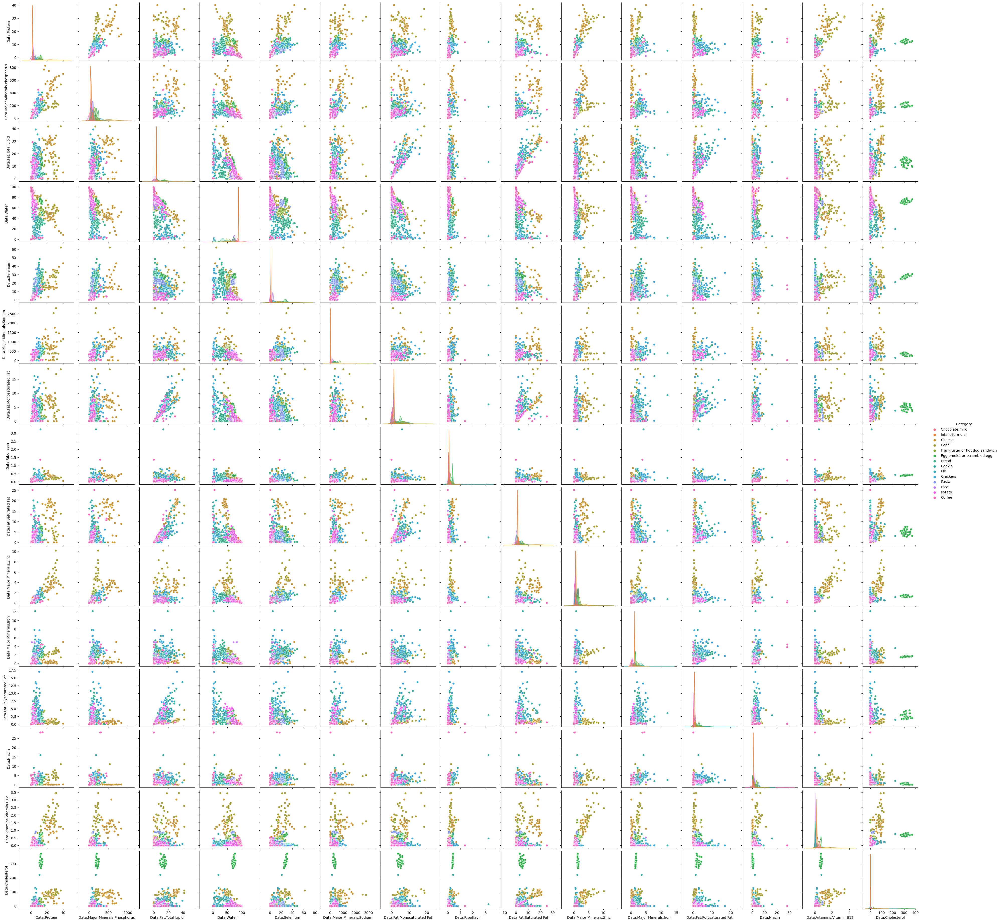

In [324]:
figout = sns.pairplot(df, hue = "Category")
plt.show()

There are relatively strong positive linear relationships between these following paris: [protein, phosphorus], [protein, zinc], [lipid, fat], [zinc, vitamin b12], these would cause potential impact to our result of clustering algorithms like k-means. 

## 4. Dataset Scaling Decisions

Looking at some basic summary statistics for each of the numerical attributes below, we can see that the scale of some attributes (like income) is much larger than the scale of other attributes like total fertility. Because the euclidean distance is used (in some point) in the creation of the t-SNE plots and our hierarchical clustering algorithms that we will be using on this dataset, this suggests that the larger scale attributes will dominate our results.

In [325]:
df = df.reset_index(drop=True)
df

,Category,Data.Protein,Data.Major Minerals.Phosphorus,Data.Fat.Total Lipid,Data.Water,Data.Selenium,Data.Major Minerals.Sodium,Data.Fat.Monosaturated Fat,Data.Riboflavin,Data.Fat.Saturated Fat,Data.Major Minerals.Zinc,Data.Major Minerals.Iron,Data.Fat.Polysaturated Fat,Data.Niacin,Data.Vitamins.Vitamin B12,Data.Cholesterol
0,Chocolate milk,3.39,101,0.00,82.34,1.9,79,0.000,0.166,0.000,0.41,0.27,0.000,0.164,0.32,2
1,Chocolate milk,3.17,101,3.39,82.30,1.9,60,0.990,0.162,2.104,0.41,0.24,0.124,0.125,0.33,12
2,Chocolate milk,2.99,102,1.90,82.17,3.4,66,0.455,0.183,1.177,0.39,0.24,0.089,0.164,0.33,8
3,Chocolate milk,3.39,101,0.00,82.34,1.9,79,0.000,0.166,0.000,0.41,0.27,0.000,0.164,0.32,2
4,Chocolate milk,3.46,96,1.11,84.50,1.9,65,0.300,0.247,0.616,0.43,0.23,0.049,0.124,0.23,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1272,Coffee,9.00,451,13.21,3.10,4.0,500,0.954,0.109,11.376,1.01,3.06,0.349,4.655,0.00,0
1273,Coffee,2.40,136,11.29,1.41,1.9,47,3.294,0.020,6.453,0.07,0.68,0.162,3.622,0.00,0
1274,Coffee,0.00,0,13.33,0.16,0.0,333,0.000,0.000,13.333,0.00,0.00,0.000,0.000,0.00,0
1275,Coffee,1.96,135,29.10,6.16,0.9,0,1.705,0.000,25.128,0.02,0.06,0.576,0.188,0.00,0


In [326]:
X = df.drop(columns=["Category"])
X.describe()

,Data.Protein,Data.Major Minerals.Phosphorus,Data.Fat.Total Lipid,Data.Water,Data.Selenium,Data.Major Minerals.Sodium,Data.Fat.Monosaturated Fat,Data.Riboflavin,Data.Fat.Saturated Fat,Data.Major Minerals.Zinc,Data.Major Minerals.Iron,Data.Fat.Polysaturated Fat,Data.Niacin,Data.Vitamins.Vitamin B12,Data.Cholesterol
count,1277.000000,1277.000000,1277.000000,1277.000000,1277.000000,1277.000000,1277.000000,1277.000000,1277.000000,1277.000000,1277.000000,1277.000000,1277.000000,1277.000000,1277.000000
mean,6.713179,118.037588,8.327510,58.831018,10.933594,312.815192,2.907865,0.169574,2.927160,1.016155,1.498301,1.771405,1.960543,0.296476,32.579483
std,6.337286,108.362607,7.672989,27.197287,10.468230,274.011221,2.918244,0.160223,3.664579,1.110215,1.268314,2.073230,2.070083,0.454432,76.053537
min,0.000000,0.000000,0.000000,0.110000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2.080000,49.000000,2.710000,41.010000,1.900000,76.000000,0.781000,0.073000,0.673000,0.460000,0.580000,0.571000,0.700000,0.000000,0.000000
50%,4.500000,93.000000,4.580000,68.460000,6.300000,275.000000,1.524000,0.118000,1.471000,0.680000,1.190000,0.972000,1.345000,0.170000,2.000000
75%,10.000000,145.000000,13.240000,80.620000,19.500000,434.000000,5.000000,0.234000,4.008000,1.210000,2.120000,2.484000,2.858000,0.370000,26.000000
max,40.000000,829.000000,41.780000,99.390000,62.000000,2790.000000,18.723000,3.229000,25.128000,10.180000,12.140000,16.949000,28.173000,3.450000,371.000000


In [327]:
X_stand=StandardScaler().fit_transform(X)
X_stand

array([[-0.52459072, -0.15728915, -1.08572711, ..., -0.8682008 ,
         0.05178571, -0.40223591],
       [-0.5593195 , -0.15728915, -0.64374445, ..., -0.88704801,
         0.07379981, -0.27069807],
       [-0.58773396, -0.14805726, -0.83800822, ..., -0.8682008 ,
         0.07379981, -0.32331321],
       ...,
       [-1.05972963, -1.08971014,  0.65221649, ..., -0.94745573,
        -0.65266544, -0.42854348],
       [-0.75032778,  0.15659514,  2.70828331, ..., -0.85660252,
        -0.65266544, -0.42854348],
       [-0.39356851,  1.15363936,  1.54009316, ...,  2.22419137,
        -0.65266544, -0.42854348]])

In [328]:
X=pd.DataFrame(X_stand, columns=X.columns)
X.head()

,Data.Protein,Data.Major Minerals.Phosphorus,Data.Fat.Total Lipid,Data.Water,Data.Selenium,Data.Major Minerals.Sodium,Data.Fat.Monosaturated Fat,Data.Riboflavin,Data.Fat.Saturated Fat,Data.Major Minerals.Zinc,Data.Major Minerals.Iron,Data.Fat.Polysaturated Fat,Data.Niacin,Data.Vitamins.Vitamin B12,Data.Cholesterol
0,-0.524591,-0.157289,-1.085727,0.864726,-0.863291,-0.853639,-0.996834,-0.022315,-0.799084,-0.546194,-0.968831,-0.854753,-0.868201,0.051786,-0.402236
1,-0.559319,-0.157289,-0.643744,0.863254,-0.863291,-0.923007,-0.657456,-0.047290,-0.224714,-0.546194,-0.992494,-0.794919,-0.887048,0.073800,-0.270698
2,-0.587734,-0.148057,-0.838008,0.858473,-0.719945,-0.901101,-0.840857,0.083829,-0.477775,-0.564215,-0.992494,-0.811808,-0.868201,0.073800,-0.323313
3,-0.524591,-0.157289,-1.085727,0.864726,-0.863291,-0.853639,-0.996834,-0.022315,-0.799084,-0.546194,-0.968831,-0.854753,-0.868201,0.051786,-0.402236
4,-0.513541,-0.203449,-0.941007,0.944176,-0.863291,-0.904752,-0.893992,0.483428,-0.630922,-0.528172,-1.000381,-0.831109,-0.887531,-0.146341,-0.362775


In [329]:
df_stand=X.copy()
df_stand['Category']=df['Category']
df_stand.head()

,Data.Protein,Data.Major Minerals.Phosphorus,Data.Fat.Total Lipid,Data.Water,Data.Selenium,Data.Major Minerals.Sodium,Data.Fat.Monosaturated Fat,Data.Riboflavin,Data.Fat.Saturated Fat,Data.Major Minerals.Zinc,Data.Major Minerals.Iron,Data.Fat.Polysaturated Fat,Data.Niacin,Data.Vitamins.Vitamin B12,Data.Cholesterol,Category
0,-0.524591,-0.157289,-1.085727,0.864726,-0.863291,-0.853639,-0.996834,-0.022315,-0.799084,-0.546194,-0.968831,-0.854753,-0.868201,0.051786,-0.402236,Chocolate milk
1,-0.559319,-0.157289,-0.643744,0.863254,-0.863291,-0.923007,-0.657456,-0.047290,-0.224714,-0.546194,-0.992494,-0.794919,-0.887048,0.073800,-0.270698,Chocolate milk
2,-0.587734,-0.148057,-0.838008,0.858473,-0.719945,-0.901101,-0.840857,0.083829,-0.477775,-0.564215,-0.992494,-0.811808,-0.868201,0.073800,-0.323313,Chocolate milk
3,-0.524591,-0.157289,-1.085727,0.864726,-0.863291,-0.853639,-0.996834,-0.022315,-0.799084,-0.546194,-0.968831,-0.854753,-0.868201,0.051786,-0.402236,Chocolate milk
4,-0.513541,-0.203449,-0.941007,0.944176,-0.863291,-0.904752,-0.893992,0.483428,-0.630922,-0.528172,-1.000381,-0.831109,-0.887531,-0.146341,-0.362775,Chocolate milk


## 5. Clusterability and Clustering Structure Questions

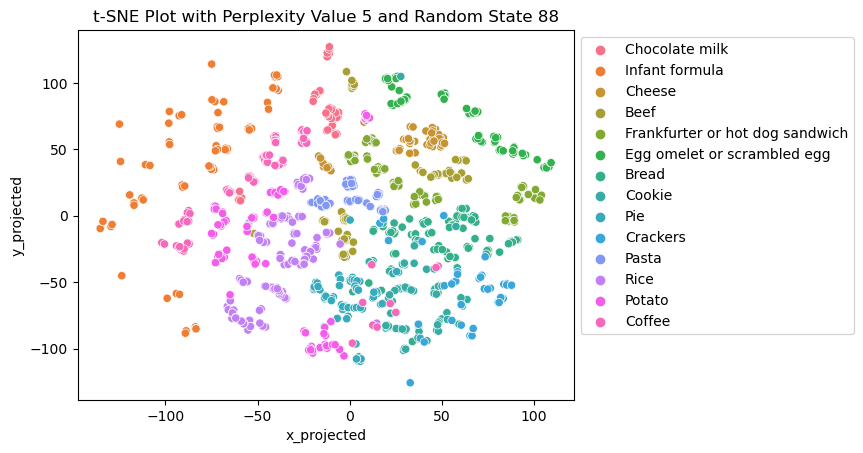

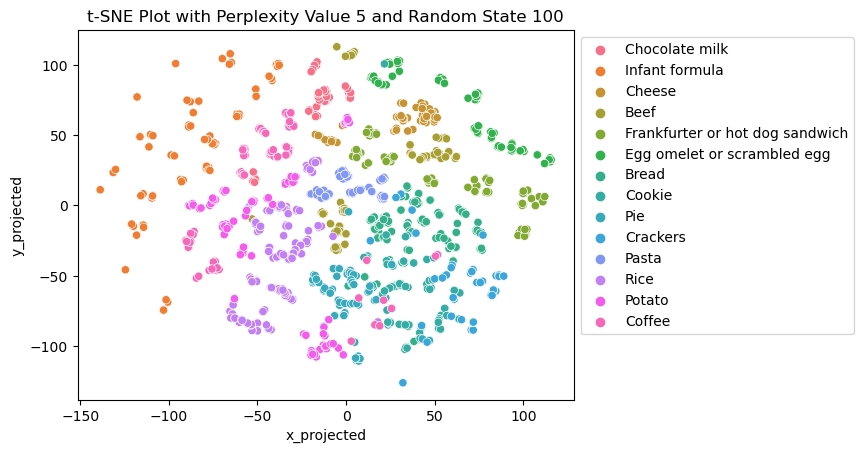

--------------------------------------------


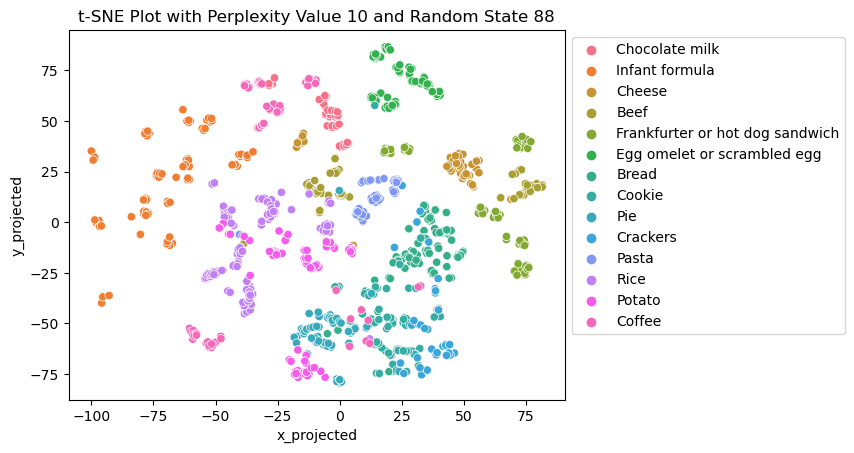

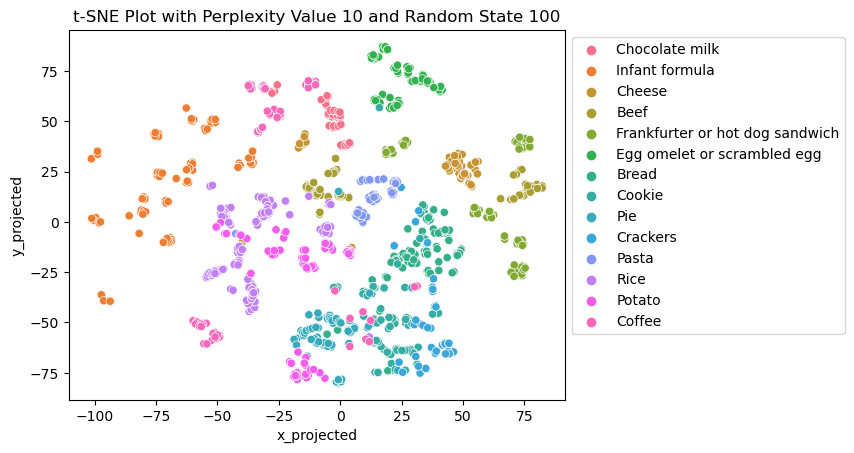

--------------------------------------------


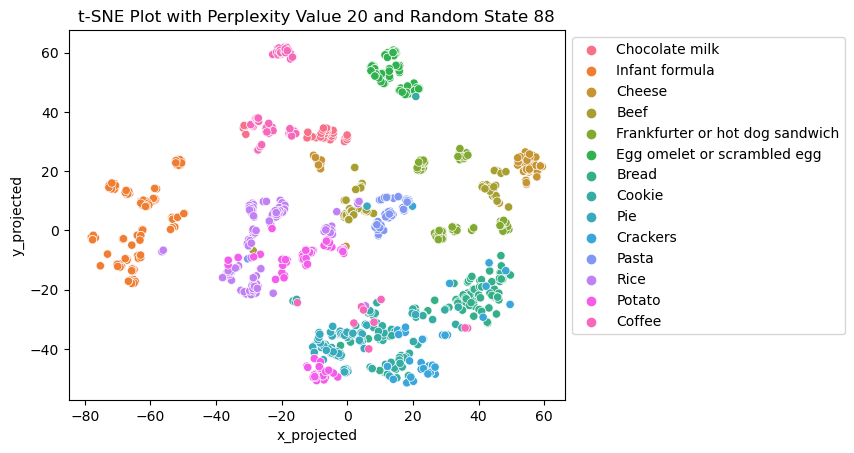

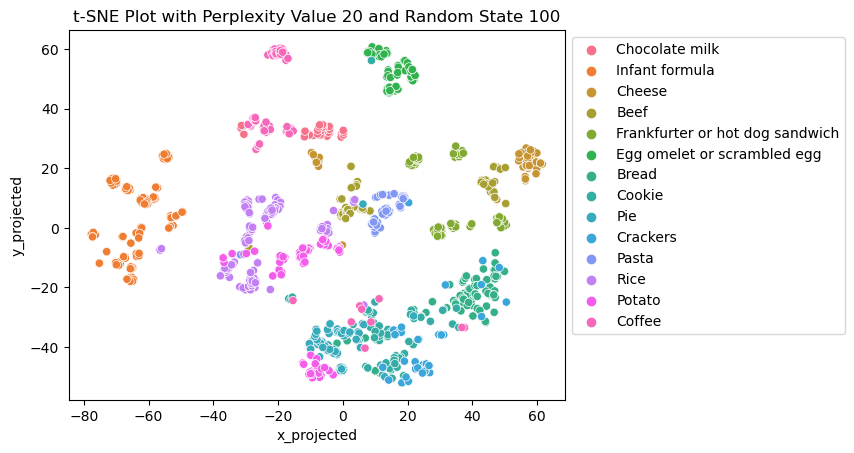

--------------------------------------------


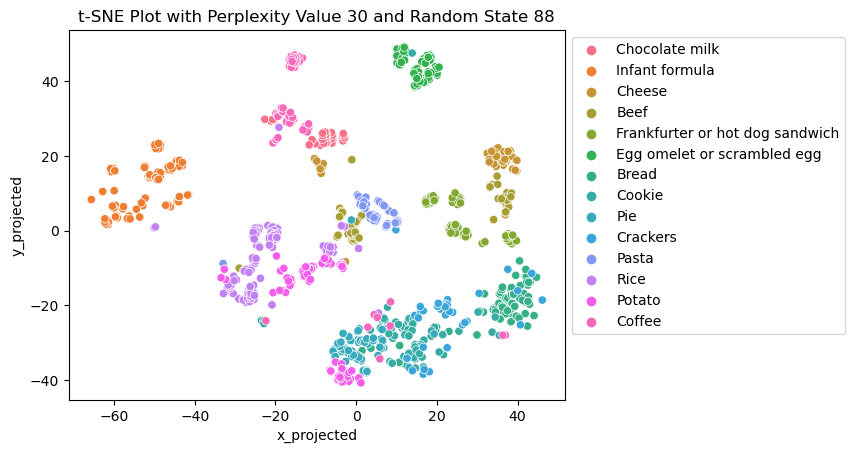

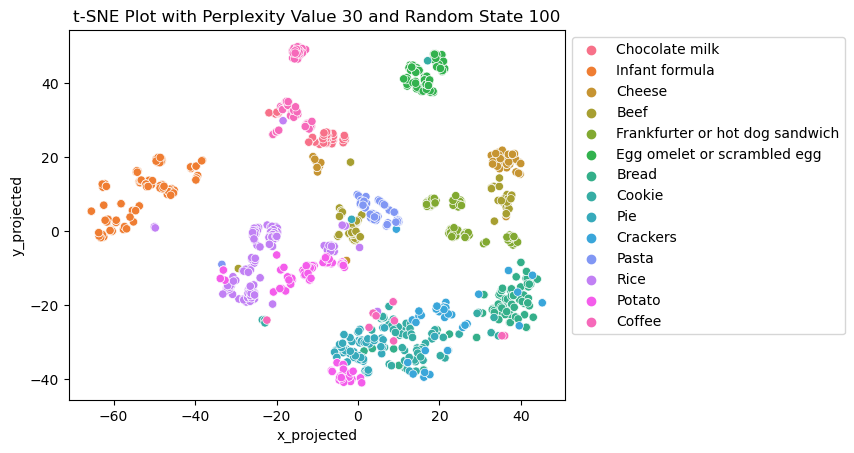

--------------------------------------------


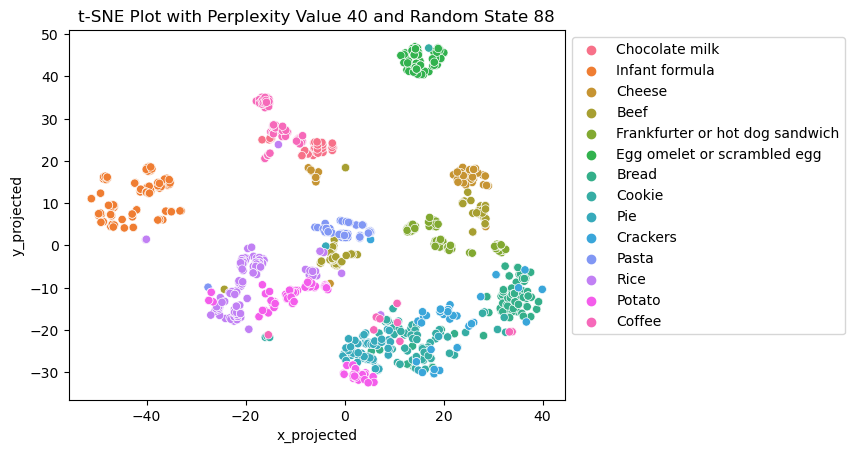

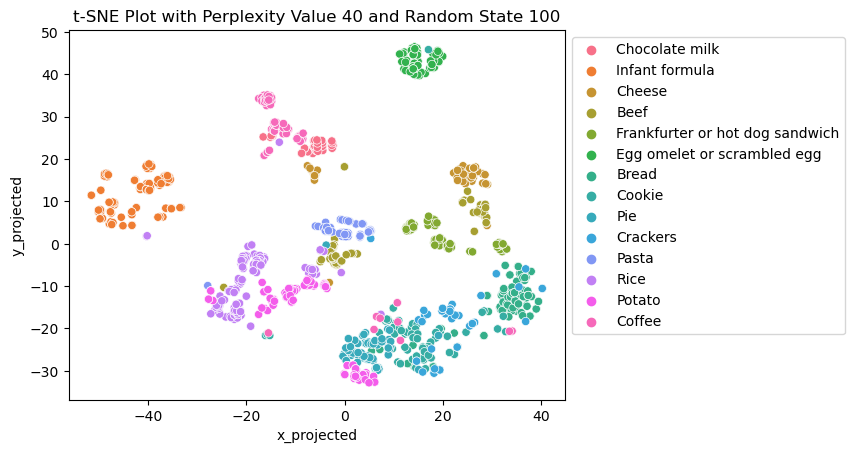

--------------------------------------------


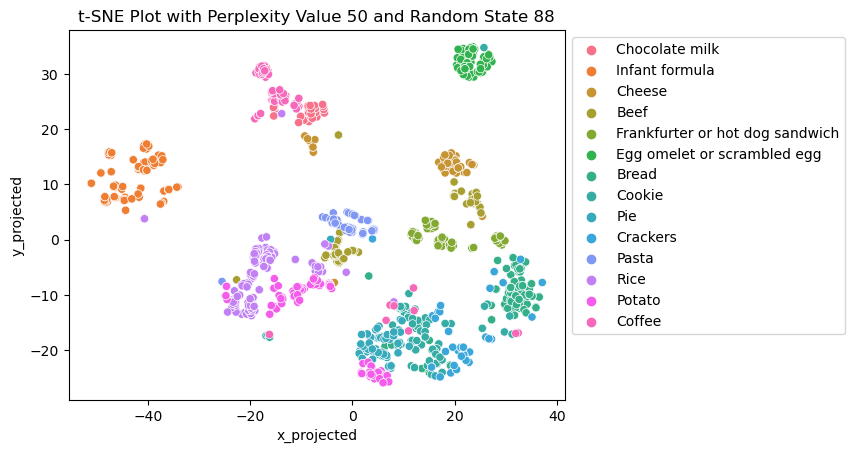

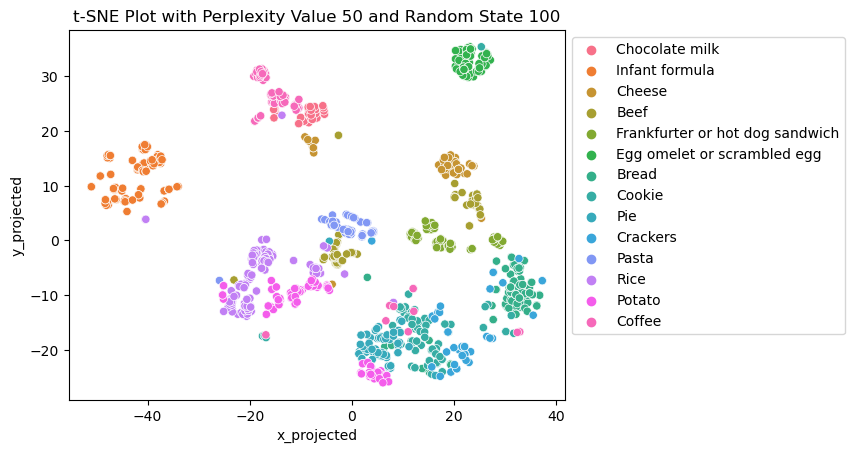

--------------------------------------------


In [330]:
for perp in [5,10, 20, 30, 40, 50]:
    for rs in [88,100]:
        tsne = TSNE(n_components=2, perplexity=perp, random_state=rs)
        data_tsne = tsne.fit_transform(X)
        df_tsne = pd.DataFrame(data_tsne, columns=['x_projected', 'y_projected'])
        df_combo = pd.concat([df, df_tsne], axis=1)
        sns.scatterplot(x='x_projected',y='y_projected', hue='Category', data=df_combo)
        plt.title('t-SNE Plot with Perplexity Value %s and Random State %s' %(perp, rs))
        plt.legend(bbox_to_anchor=(1,1))
        plt.show()
    print('--------------------------------------------')

We would like to pick t_SNE plot with perplexity value = 50 and random state 88 that reflect the cluterability.

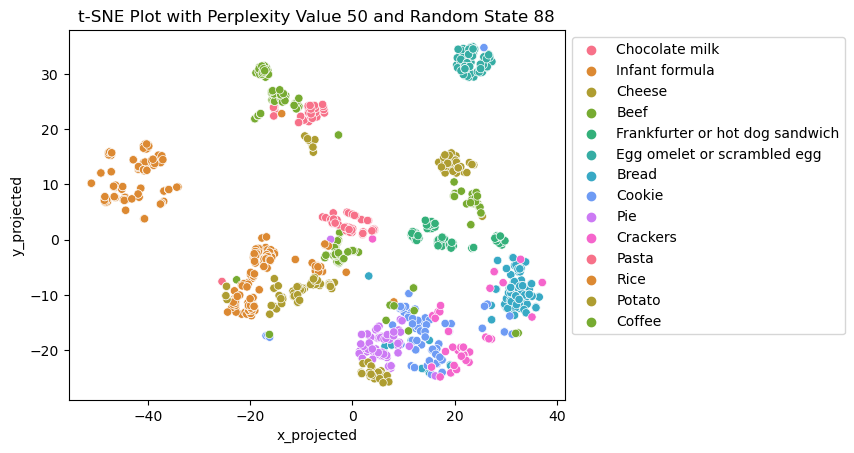

In [331]:
tsne = TSNE(n_components=2, perplexity=50, random_state=88)
data_tsne = tsne.fit_transform(X)
df_tsne = pd.DataFrame(data_tsne, columns=['x_projected', 'y_projected'])
df_combo = pd.concat([df, df_tsne], axis=1)
sns.scatterplot(x='x_projected',y='y_projected', hue='Category', palette=sns.color_palette("husl", 10), data=df_combo)
plt.title('t-SNE Plot with Perplexity Value %s and Random State %s' %(50, 88))
plt.legend(bbox_to_anchor=(1,1))
plt.show()

a. Approximately how many underlying clusters does the data have?

    The dataset has approximately 7 to 8 underlying clusters.

b. What are the shapes of the underlying clusters?

    The shapes of the underlying clusters are roughly spherical.

c. Are the clusters balanced in size?

    Yes, the clusters are balanced in size.

d. Do any of the clusters that you identified overlap with each other?

    Yes, there is some overlap between the clusters, particularly in the right and middle parts of the t-SNE plot. This indicates that the data points in these overlapping areas share some similarities, and the clustering algorithm might have a harder time separating them into distinct groups.

## 6. Algorithm Selection Motivation

Since we observed an overlapped and pretty mixed cluster structure in the TSNE plot, we think a Soft Assignment Algorithms such as Fuzzy C-Means and Gaussian Mixture Models may work better here.

For GMM, it is a relatively flexible clustering algorithm that allows for overlapping clusters and diverse shapes, and does not require prior knowledge of the fuzziness of clusters, it also can generate new observations based on current cluster structure, leaving a potential door for new food product development.

## 7. Clustering Algorithm 1 (change name to the algorithm you chose)



### 7.1. Parameter Selection

### 7.2. Clustering Algorithm

### 7.3. Clustering Algorithm Results Presentation

### 7.4. Assessing Clustering Separation and Cohesion

### 7.5. Additional Analysis

### 7.6. Describing Each of the Clusters

## 8. Gaussian Mixture Model

### 8.1. Parameter Selection

For this part, I plan to use PCA (sort of) to select parametres since PCA can tell people how much of a variation a bunch of parameters keep. For this sake, we need to first start with the un-standardized data to observe their data such as std and variance.

In [332]:
X2 = StandardScaler(with_std=False).fit_transform(df.drop(['Category'], axis=1))    #PCA require mean-scaled data
X2 = pd.DataFrame(X2, columns=df.drop(['Category'], axis=1).columns)
X2

,Data.Protein,Data.Major Minerals.Phosphorus,Data.Fat.Total Lipid,Data.Water,Data.Selenium,Data.Major Minerals.Sodium,Data.Fat.Monosaturated Fat,Data.Riboflavin,Data.Fat.Saturated Fat,Data.Major Minerals.Zinc,Data.Major Minerals.Iron,Data.Fat.Polysaturated Fat,Data.Niacin,Data.Vitamins.Vitamin B12,Data.Cholesterol
0,-3.323179,-17.037588,-8.32751,23.508982,-9.033594,-233.815192,-2.907865,-0.003574,-2.92716,-0.606155,-1.228301,-1.771405,-1.796543,0.023524,-30.579483
1,-3.543179,-17.037588,-4.93751,23.468982,-9.033594,-252.815192,-1.917865,-0.007574,-0.82316,-0.606155,-1.258301,-1.647405,-1.835543,0.033524,-20.579483
2,-3.723179,-16.037588,-6.42751,23.338982,-7.533594,-246.815192,-2.452865,0.013426,-1.75016,-0.626155,-1.258301,-1.682405,-1.796543,0.033524,-24.579483
3,-3.323179,-17.037588,-8.32751,23.508982,-9.033594,-233.815192,-2.907865,-0.003574,-2.92716,-0.606155,-1.228301,-1.771405,-1.796543,0.023524,-30.579483
4,-3.253179,-22.037588,-7.21751,25.668982,-9.033594,-247.815192,-2.607865,0.077426,-2.31116,-0.586155,-1.268301,-1.722405,-1.836543,-0.066476,-27.579483
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1272,2.286821,332.962412,4.88249,-55.731018,-6.933594,187.184808,-1.953865,-0.060574,8.44884,-0.006155,1.561699,-1.422405,2.694457,-0.296476,-32.579483
1273,-4.313179,17.962412,2.96249,-57.421018,-9.033594,-265.815192,0.386135,-0.149574,3.52584,-0.946155,-0.818301,-1.609405,1.661457,-0.296476,-32.579483
1274,-6.713179,-118.037588,5.00249,-58.671018,-10.933594,20.184808,-2.907865,-0.169574,10.40584,-1.016155,-1.498301,-1.771405,-1.960543,-0.296476,-32.579483
1275,-4.753179,16.962412,20.77249,-52.671018,-10.033594,-312.815192,-1.202865,-0.169574,22.20084,-0.996155,-1.438301,-1.195405,-1.772543,-0.296476,-32.579483


In [333]:
np.sum(np.round(np.mean(X2)))   #indeed, each column mean 0

0.0

In [334]:
X2.var().sort_values(ascending=False)    #each feature's variances

Data.Major Minerals.Sodium        75082.149205
Data.Major Minerals.Phosphorus    11742.454699
Data.Cholesterol                   5784.140425
Data.Water                          739.692412
Data.Selenium                       109.583831
Data.Fat.Total Lipid                 58.874762
Data.Protein                         40.161190
Data.Fat.Saturated Fat               13.429139
Data.Fat.Monosaturated Fat            8.516146
Data.Fat.Polysaturated Fat            4.298282
Data.Niacin                           4.285242
Data.Major Minerals.Iron              1.608621
Data.Major Minerals.Zinc              1.232577
Data.Vitamins.Vitamin B12             0.206509
Data.Riboflavin                       0.025671
dtype: float64

In [335]:
C = np.cov(X2.T)             #find the covariance matrix of scaled
l, v = np.linalg.eig(C)      #find the Eigen-values and Eigen-vectors
print('Below Sorted Eigen-values of Covariance Matrix C:')
l_sorted = np.sort(l)[::-1]
print(l_sorted)

Below Sorted Eigen-values of Covariance Matrix C:
[7.98737865e+04 8.89303112e+03 4.19824574e+03 5.15602659e+02
 6.53404045e+01 2.63306303e+01 9.07535472e+00 4.22491398e+00
 2.24137422e+00 1.69493132e+00 7.12884130e-01 2.72549106e-01
 5.21926251e-02 3.51608067e-02 1.23300576e-02]


In [336]:
cumvar = np.round(np.cumsum(l_sorted)/np.sum(l_sorted), 4)   #get the variance ratio list
cumvar

array([0.8534, 0.9485, 0.9933, 0.9988, 0.9995, 0.9998, 0.9999, 0.9999,
       1.    , 1.    , 1.    , 1.    , 1.    , 1.    , 1.    ])

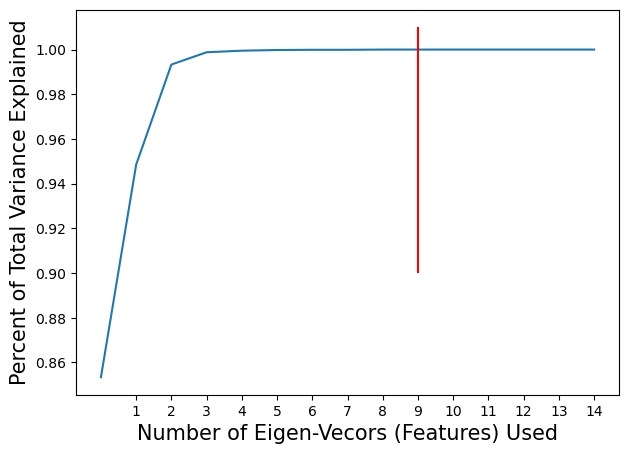

In [337]:
plt.figure(figsize=(7,5))            #visualize it
plt.plot(cumvar)
plt.xticks(range(1, 17, 1))
plt.xlabel('Number of Eigen-Vecors (Features) Used', fontsize=15)
plt.ylabel('Percent of Total Variance Explained', fontsize=15)
plt.vlines(9, ymin=0.9, ymax=1.01, color='red')
plt.show()

Seems that keep the first 9 variables should be surely enough.

In [338]:
X2.var().sort_values(ascending=False)[:9]

Data.Major Minerals.Sodium        75082.149205
Data.Major Minerals.Phosphorus    11742.454699
Data.Cholesterol                   5784.140425
Data.Water                          739.692412
Data.Selenium                       109.583831
Data.Fat.Total Lipid                 58.874762
Data.Protein                         40.161190
Data.Fat.Saturated Fat               13.429139
Data.Fat.Monosaturated Fat            8.516146
dtype: float64

In [339]:
features2 = X2.var().sort_values(ascending=False)[:9].keys()
features2

Index(['Data.Major Minerals.Sodium', 'Data.Major Minerals.Phosphorus',
       'Data.Cholesterol', 'Data.Water', 'Data.Selenium',
       'Data.Fat.Total Lipid', 'Data.Protein', 'Data.Fat.Saturated Fat',
       'Data.Fat.Monosaturated Fat'],
      dtype='object')

We can observe that the first 14 features with the largest variances are enough for us to grasp a total of around 100% percent of the variances in the dataset (all the variances).

### 8.2. Clustering Algorithm

What K should we use? -TSNE, AIC, BIC, Silhouette Plot

In [340]:
X2 = StandardScaler().fit_transform(df[features2])    #recreate the tsne with our selected features
X2 = pd.DataFrame(X2, columns=features2)
X2

,Data.Major Minerals.Sodium,Data.Major Minerals.Phosphorus,Data.Cholesterol,Data.Water,Data.Selenium,Data.Fat.Total Lipid,Data.Protein,Data.Fat.Saturated Fat,Data.Fat.Monosaturated Fat
0,-0.853639,-0.157289,-0.402236,0.864726,-0.863291,-1.085727,-0.524591,-0.799084,-0.996834
1,-0.923007,-0.157289,-0.270698,0.863254,-0.863291,-0.643744,-0.559319,-0.224714,-0.657456
2,-0.901101,-0.148057,-0.323313,0.858473,-0.719945,-0.838008,-0.587734,-0.477775,-0.840857
3,-0.853639,-0.157289,-0.402236,0.864726,-0.863291,-1.085727,-0.524591,-0.799084,-0.996834
4,-0.904752,-0.203449,-0.362775,0.944176,-0.863291,-0.941007,-0.513541,-0.630922,-0.893992
...,...,...,...,...,...,...,...,...,...
1272,0.683396,3.073873,-0.428543,-2.049942,-0.662606,0.636571,0.360993,2.306445,-0.669797
1273,-0.970469,0.165827,-0.428543,-2.112105,-0.863291,0.386245,-0.680870,0.962518,0.132369
1274,0.073693,-1.089710,-0.428543,-2.158083,-1.044864,0.652216,-1.059730,2.840686,-0.996834
1275,-1.142062,0.156595,-0.428543,-1.937386,-0.958856,2.708283,-0.750328,6.060597,-0.412350


TSNE

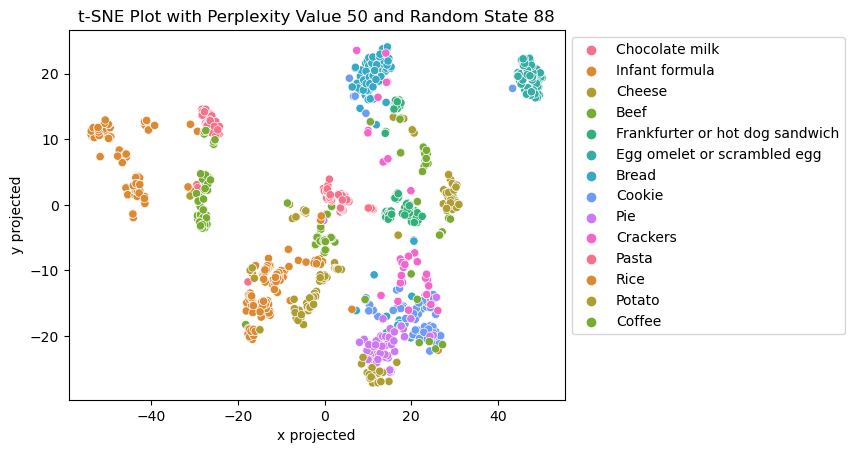

In [341]:
tsne = TSNE(n_components=2, perplexity=50, random_state=88)
data_tsne = tsne.fit_transform(X2[features2])  #make sure we only plot the numeric columns
df_tsne = pd.DataFrame(data_tsne, columns=['x projected', 'y projected'])
comb = pd.concat([df, df_tsne], axis=1)
sns.scatterplot(x='x projected',y='y projected', hue='Category', palette=sns.color_palette("husl", 10), data=comb)
plt.title('t-SNE Plot with Perplexity Value %s and Random State %s' %(50, 88))
plt.legend(bbox_to_anchor=(1,1))
plt.show()

It seems TSNE gave us a K ranging from 5 to 10. Lets consult other algorithms and plots to decide on the k. First, AIC and BIC.

AIC, BIC

In [342]:
n = X2.shape[0]
d = X2.shape[1]
k = n / (41*(1+d+d^2))
k

1.8321377331420372

In [343]:
aics = []
bics = []

for k in range(1, 10+1):
    gm = GaussianMixture(n_components=k, random_state=88)
    gm.fit(X2)

    aics.append(gm.aic(X2))
    bics.append(gm.bic(X2))

print(aics)
print('------------------')
print(bics)

[22619.652849980965, 12080.64449808227, 7849.751321273282, 5013.94533823167, 2755.566818472023, 2481.2473902209476, 1926.0412192842912, -430.00891717274, -1374.295367916237, -1826.0187560032432]
------------------
[22897.87536820672, 12642.241803389818, 8694.723413662618, 6142.292217702796, 4167.288485024939, 4176.343843855653, 3904.5124600007866, 1831.837110625545, 1170.9254469638377, 1002.5768459586211]


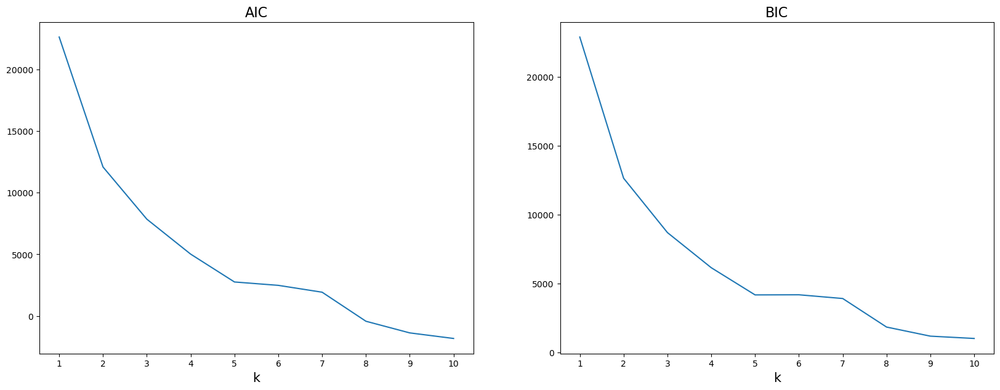

In [344]:
fig, ax = plt.subplots(1,2, figsize=(20,7))

#AIC
ax[0].plot(range(1, 10+1), aics)
ax[0].set_xticks(range(1, 10+1))
ax[0].set_xlabel('k', fontsize=15)
ax[0].set_title('AIC', fontsize=16)

#BIC
ax[1].plot(range(1, 10+1), bics)
ax[1].set_xticks(range(1, 10+1))
ax[1].set_xlabel('k', fontsize=15)
ax[1].set_title('BIC', fontsize=16)

plt.show()

It seems that AIC and BIC does not really work here. What about the Silhouette Plot with each GMM model, k from 2-10?

Silhouette Plot

In [345]:
K_list = range(2, 10+1)
trial_num = 3

avg_avg_sil_score_list = []
for k in K_list:
    avg_sil_score_list = []

    for i in range(0, trial_num):
        gm = GaussianMixture(n_components=k, random_state=88)
        gm.fit(X2)
        W = gm.predict_proba(X2)
        cluster_labels = np.argmax(W, axis=1).tolist()     #convert the GMM result to a hard-assignment
        avg_sil_score=silhouette_score(X2, cluster_labels)
        
        avg_sil_score_list.append(avg_sil_score)
    
    avg_avg_sil_score_list.append(np.average(avg_sil_score_list))
     
avg_avg_sil_score_list

[0.34441043405789146,
 0.30972385805989144,
 0.2789668505386661,
 0.3087834370894986,
 0.3237136586233242,
 0.3398308210890379,
 0.30109935554102113,
 0.31546105210659875,
 0.3184161085403197]

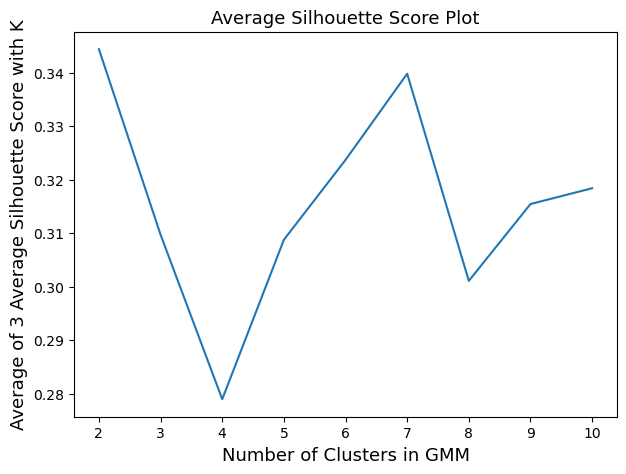

In [346]:
plt.figure(figsize=(7, 5))
plt.plot(K_list, avg_avg_sil_score_list)
plt.xlabel('Number of Clusters in GMM', fontsize=13)
plt.ylabel('Average of 3 Average Silhouette Score with K', fontsize=13)
plt.title('Average Silhouette Score Plot', fontsize=13)
plt.show()

Wow, it seems the Silhouette Plot is suggesting a K of 7. Lets proceed with this K into GMM.

Lets fit GMM.

In [347]:
k=7

gm = GaussianMixture(n_components=k, random_state=88)
gm.fit(X2)

W = gm.predict_proba(X2)
W

array([[1.42764633e-017, 9.99653740e-001, 8.09837340e-008, ...,
        2.83172832e-023, 3.46179296e-004, 4.46754082e-011],
       [5.09226224e-016, 7.94840744e-003, 2.65929877e-004, ...,
        2.35214466e-017, 9.91785631e-001, 3.13369948e-008],
       [1.30430795e-017, 9.97973022e-001, 6.70763727e-007, ...,
        1.11919908e-021, 2.02630731e-003, 5.31058787e-011],
       ...,
       [0.00000000e+000, 0.00000000e+000, 1.00000000e+000, ...,
        1.05776036e-241, 2.46981170e-052, 7.00375705e-020],
       [0.00000000e+000, 0.00000000e+000, 1.00000000e+000, ...,
        6.32319251e-151, 1.83427663e-187, 2.65882792e-044],
       [2.05150012e-077, 2.18422513e-285, 9.94831563e-001, ...,
        3.02964762e-161, 2.18601080e-029, 5.16843672e-003]])

In [348]:
membership_columns = ['Cluster %s Membership Score'%(str(i)) for i in range(0, k)]
df_membership = pd.DataFrame(W, columns=membership_columns).round(4)
df_membership

,Cluster 0 Membership Score,Cluster 1 Membership Score,Cluster 2 Membership Score,Cluster 3 Membership Score,Cluster 4 Membership Score,Cluster 5 Membership Score,Cluster 6 Membership Score
0,0.0,0.9997,0.0000,0.0,0.0,0.0003,0.0000
1,0.0,0.0079,0.0003,0.0,0.0,0.9918,0.0000
2,0.0,0.9980,0.0000,0.0,0.0,0.0020,0.0000
3,0.0,0.9997,0.0000,0.0,0.0,0.0003,0.0000
4,0.0,1.0000,0.0000,0.0,0.0,0.0000,0.0000
...,...,...,...,...,...,...,...
1272,0.0,0.0000,0.0000,0.0,0.0,0.0000,1.0000
1273,0.0,0.0000,1.0000,0.0,0.0,0.0000,0.0000
1274,0.0,0.0000,1.0000,0.0,0.0,0.0000,0.0000
1275,0.0,0.0000,1.0000,0.0,0.0,0.0000,0.0000


### 8.3. Clustering Algorithm Results Presentation

Lets plot k=7 t-SNE plots and color-code the objects by their kth cluster membership weight.

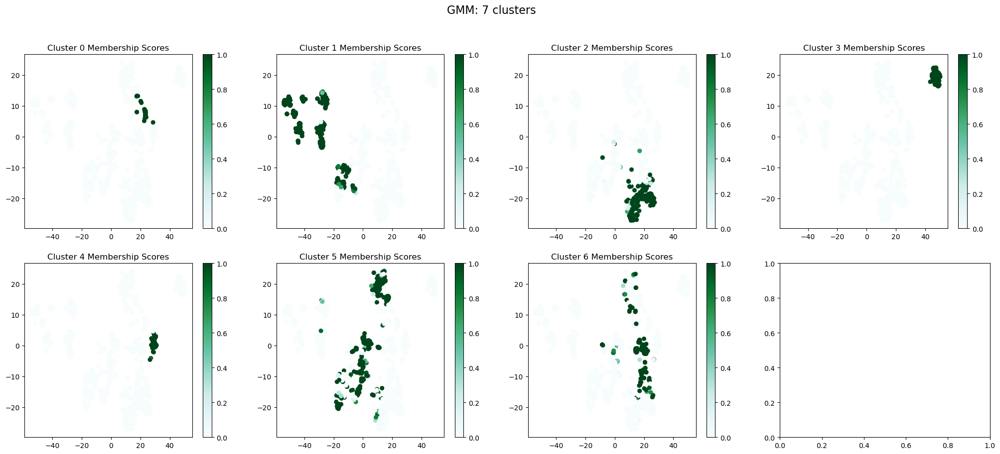

In [349]:
fig, ax = plt.subplots(2, 4, figsize=(25, 10))
plt.suptitle('GMM: %s clusters'%(k), fontsize=16)    #ignore last picture plz
for i in range(0,k):

    comb['Cluster %s Membership Score'%str(i)]=df_membership['Cluster %s Membership Score'%(str(i))]

    points = ax[int(np.floor(i/4)),int(i%4)].scatter(comb["x projected"], comb["y projected"],
                         c=comb['Cluster %s Membership Score'%str(i)],
                         s=30, cmap="BuGn",
                         vmin=0,
                         vmax=1)

    fig.colorbar(points, ax=ax[int(np.floor(i/4)),int(i%4)])
    ax[int(np.floor(i/4)),int(i%4)].set_title('Cluster %s Membership Scores'%(str(i)))

plt.show()

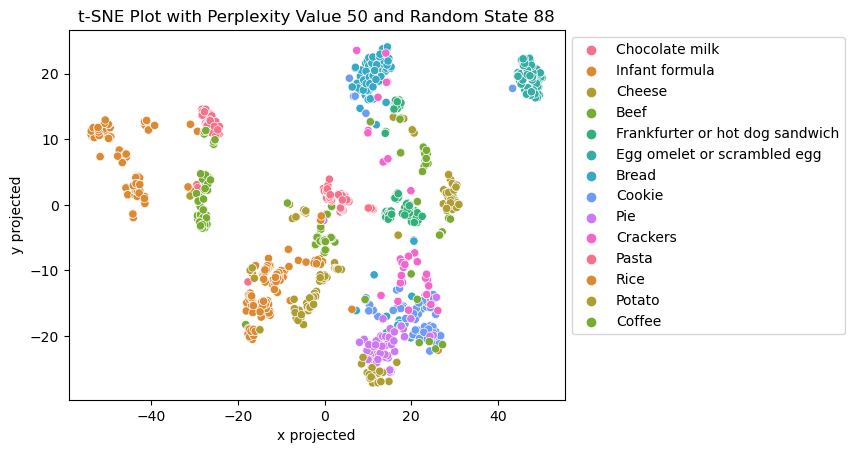

In [387]:
tsne = TSNE(n_components=2, perplexity=50, random_state=88)
data_tsne = tsne.fit_transform(X2[features2])
df_tsne = pd.DataFrame(data_tsne, columns=['x projected', 'y projected'])
comb = pd.concat([df, df_tsne], axis=1)
sns.scatterplot(x='x projected',y='y projected', hue='Category', palette=sns.color_palette("husl", 10), data=comb)
plt.title('t-SNE Plot with Perplexity Value %s and Random State %s' %(50, 88))
plt.legend(bbox_to_anchor=(1,1))
plt.show()

It looks like GMM divided the middle bottom cluster into 3 parts and integrated it with other clusters around it (top-left, top-middle, top-relatively-right), and these integrated Clusters (Cluster 1, 5 and 6) are not really dense in shape and spread a relatively long distance in the 2-d graph, which is actually not surprising since our original TSNE plot suggested a overlapping structure of the true Food Class Labels.

### 8.4. Assessing Clustering Separation and Cohesion

Lets us create a silhouette plot and calculate the average silhouette score with a hard assignement version of this GMM result, and discuss the separation and cohesion of each of the clusters and the overall clustering. Next, lets explore if there are any objects that have poor cohesion with their assigned cluster.

In [350]:
k=7

gm = GaussianMixture(n_components=k, random_state=88)
gm.fit(X2)

W = gm.predict_proba(X2)

labels = np.argmax(W, axis=1).tolist()      #convert the GMM into a total hard-assignment
labels

[1,
 5,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 5,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 0,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 0,
 4,
 4,
 4,
 4,


In [351]:
set(labels)  #indeed 7 clusters

{0, 1, 2, 3, 4, 5, 6}

In [352]:
silhouette_score(X2, labels)

0.33983082108903784

In [353]:
def show_silhouette_plots(X,cluster_labels):
    #How many clusters in your clustering?
    n_clusters=len(np.unique(cluster_labels))    

    # Create a subplot with 1 row and 2 columns
    fig, ax1 = plt.subplots(1, 1)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient fcan range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])


    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]
    

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

        ax1.set_title("The silhouette plot for the various clusters.")
        ax1.set_xlabel("The silhouette coefficient values")
        ax1.set_ylabel("Cluster label")

        # The vertical line for average silhouette score of all the values
        ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

        ax1.set_yticks([])  # Clear the yaxis labels / ticks
        ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])


    plt.show()
    
    return

In [354]:
X2['predicted_cluster']=labels
X2.head()

,Data.Major Minerals.Sodium,Data.Major Minerals.Phosphorus,Data.Cholesterol,Data.Water,Data.Selenium,Data.Fat.Total Lipid,Data.Protein,Data.Fat.Saturated Fat,Data.Fat.Monosaturated Fat,predicted_cluster
0,-0.853639,-0.157289,-0.402236,0.864726,-0.863291,-1.085727,-0.524591,-0.799084,-0.996834,1
1,-0.923007,-0.157289,-0.270698,0.863254,-0.863291,-0.643744,-0.559319,-0.224714,-0.657456,5
2,-0.901101,-0.148057,-0.323313,0.858473,-0.719945,-0.838008,-0.587734,-0.477775,-0.840857,1
3,-0.853639,-0.157289,-0.402236,0.864726,-0.863291,-1.085727,-0.524591,-0.799084,-0.996834,1
4,-0.904752,-0.203449,-0.362775,0.944176,-0.863291,-0.941007,-0.513541,-0.630922,-0.893992,1


For n_clusters = 7 The average silhouette_score is : 0.5200235690566136


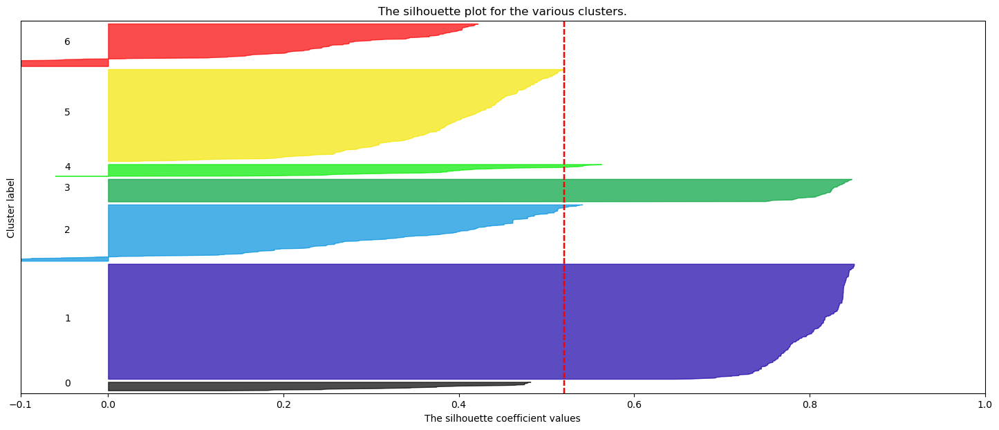

In [355]:
show_silhouette_plots(X2, X2['predicted_cluster'])

The Average Silhouette Score of 0.5200235690566136 is not bad given that the original Food Labels are actually overlapping with each other, and we are actually not trying to re-create a Cluster Label similar to the True Labels.

To be more specifically with the Silhouette Plot, it seems that the average Silhouette Situation for each cluster is pretty diverse, which means that there are some clusters (1, 3) with a pretty high Cohesion score while the other clusters all are below the average Silhouette Score, indicating that these other clusters are either not as Cohesive as 1 nor 3 (0, 5), nor that there exists some points in these clusters that actually are closer to a neighboring cluster, bringing a higher Separation than Cohesion for these points in those clusters (2, 6). However, the case is quite special with Cluster 4. It has a Silhouette Score a little bit above the whole average of 0.5200235690566136 while still has some negative scores, this may be because that some points in Cluster 4 are pretty dense while some a quite sparse, while can be observed from the TSNE plot below.

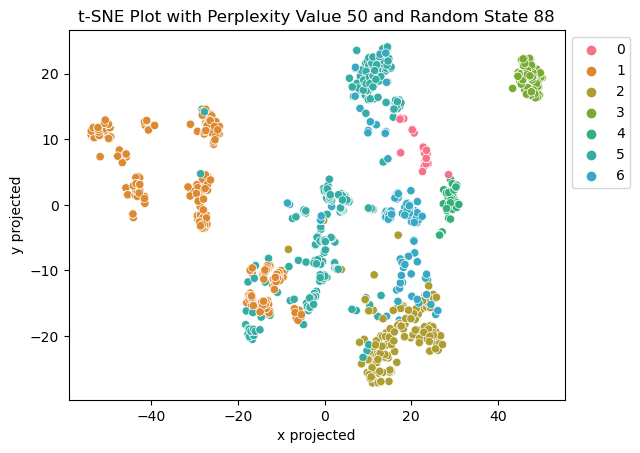

In [388]:
tsne = TSNE(n_components=2, perplexity=50, random_state=88)
data_tsne = tsne.fit_transform(X2[features2])
df_tsne = pd.DataFrame(data_tsne, columns=['x projected', 'y projected'])
comb = pd.concat([df, df_tsne], axis=1)
sns.scatterplot(x='x projected',y='y projected', hue='predicted_cluster', palette=sns.color_palette("husl", 10), data=comb)
plt.title('t-SNE Plot with Perplexity Value %s and Random State %s' %(50, 88))
plt.legend(bbox_to_anchor=(1,1))
plt.show()

### 8.5. Additional Analysis

In [356]:
X2['Category'] = df['Category']
adjusted_rand_score(X2['predicted_cluster'], X2['Category'])

0.30478636311452656

In [357]:
#Homogeneity Score, whether or not the same cluster to the same label
homogeneity_score(X2['predicted_cluster'], X2['Category'])

0.699414550881025

In [358]:
#Completeness Score, whether or not the same label to the same cluster
completeness_score(X2['predicted_cluster'], X2['Category'])

0.44999239292844156

In [359]:
v_measure_score(X2['predicted_cluster'], X2['Category'])

0.5476410754172296

Overall, the Homogeneity Score and Completeness Score are all not really far from 0.5, indicating that the cluster label and the true class label does not really agree to a great degree, which agrees with the Adjusted Rand Score of User
adj_rand_score=0.30478636311452656. The V-Measure Score is also not really close to 1.

To be more specific, the Homogeneity Score are a bit higher than the Completeness Score, this may indicate that some big clusters do only have 1 true class labels classified into it, but not necessarily all the points of this class label were into that cluster, causing the Completeness Score to also be around 0.5.

Let’s dive into the below Scatter Plot with predicted labels as color and marker style with truer class labels.

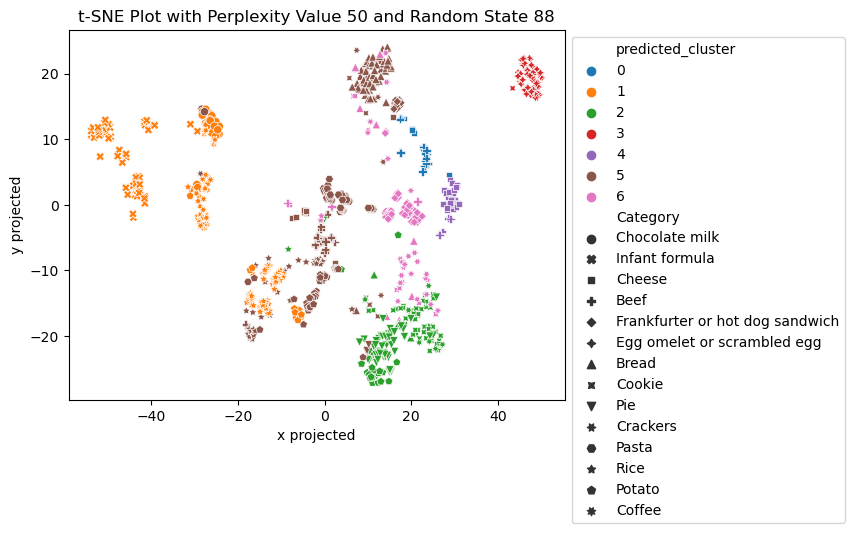

In [360]:
tsne = TSNE(n_components=2, perplexity=50, random_state=88)
data_tsne = tsne.fit_transform(X2.iloc[:, :-2])
df_tsne = pd.DataFrame(data_tsne, columns=['x projected', 'y projected'])
comb = pd.concat([df, df_tsne], axis=1)
palette = sns.color_palette("tab10")
sns.scatterplot(x='x projected',y='y projected', hue=X2['predicted_cluster'], style=X2['Category'], data=comb, palette="tab10")
plt.title('t-SNE Plot with Perplexity Value %s and Random State %s' %(50, 88))
plt.legend(bbox_to_anchor=(1,1))
plt.show()

As we can see, there indeed exist some clusters with pretty much all the points in it from the same True Class Labels (2-green, 3-red, 4-purple). Other clusters all have several mixed Class Labels in them.

### 8.6. Describing Each of the Clusters

I am going to:

    Create a side-by-side boxplots visualization for each numerical attribute in my dataset (where each cluster label is given a boxplot);

    Create a side-by-side barplot visualization for each categorical attribute in my dataset (where each cluster label appears on the x-axis);
    
    Use these plots to thoroughly describe which type of attribute values characterize each of the resulting clusters in my final clustering.

In [361]:
df['predicted_cluster']=labels   #we used the converted-absolute version of GMM to proceed, intead of the membership score
df

,Category,Data.Protein,Data.Major Minerals.Phosphorus,Data.Fat.Total Lipid,Data.Water,Data.Selenium,Data.Major Minerals.Sodium,Data.Fat.Monosaturated Fat,Data.Riboflavin,Data.Fat.Saturated Fat,Data.Major Minerals.Zinc,Data.Major Minerals.Iron,Data.Fat.Polysaturated Fat,Data.Niacin,Data.Vitamins.Vitamin B12,Data.Cholesterol,predicted_cluster
0,Chocolate milk,3.39,101,0.00,82.34,1.9,79,0.000,0.166,0.000,0.41,0.27,0.000,0.164,0.32,2,1
1,Chocolate milk,3.17,101,3.39,82.30,1.9,60,0.990,0.162,2.104,0.41,0.24,0.124,0.125,0.33,12,5
2,Chocolate milk,2.99,102,1.90,82.17,3.4,66,0.455,0.183,1.177,0.39,0.24,0.089,0.164,0.33,8,1
3,Chocolate milk,3.39,101,0.00,82.34,1.9,79,0.000,0.166,0.000,0.41,0.27,0.000,0.164,0.32,2,1
4,Chocolate milk,3.46,96,1.11,84.50,1.9,65,0.300,0.247,0.616,0.43,0.23,0.049,0.124,0.23,5,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1272,Coffee,9.00,451,13.21,3.10,4.0,500,0.954,0.109,11.376,1.01,3.06,0.349,4.655,0.00,0,6
1273,Coffee,2.40,136,11.29,1.41,1.9,47,3.294,0.020,6.453,0.07,0.68,0.162,3.622,0.00,0,2
1274,Coffee,0.00,0,13.33,0.16,0.0,333,0.000,0.000,13.333,0.00,0.00,0.000,0.000,0.00,0,2
1275,Coffee,1.96,135,29.10,6.16,0.9,0,1.705,0.000,25.128,0.02,0.06,0.576,0.188,0.00,0,2


Numeric Columns

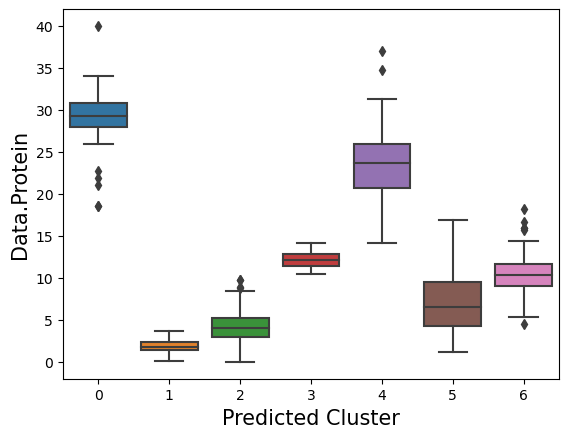

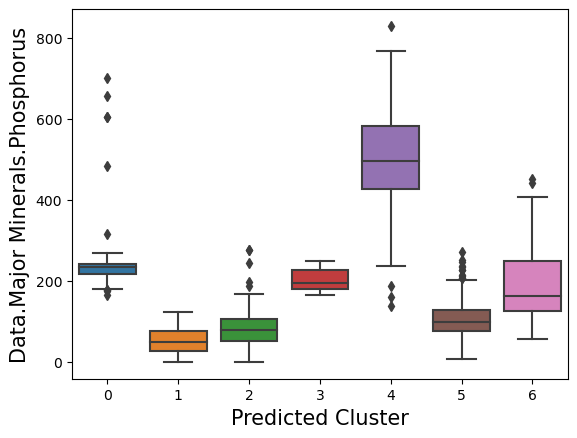

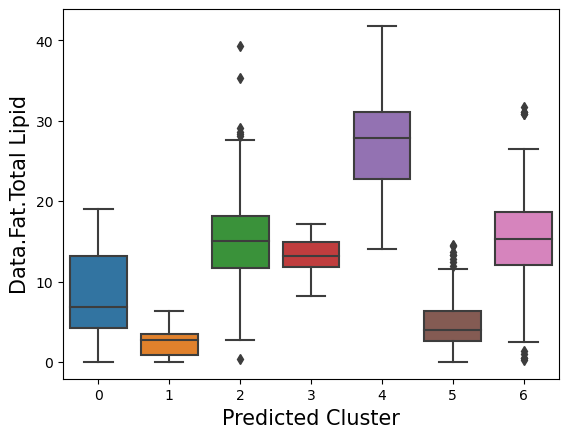

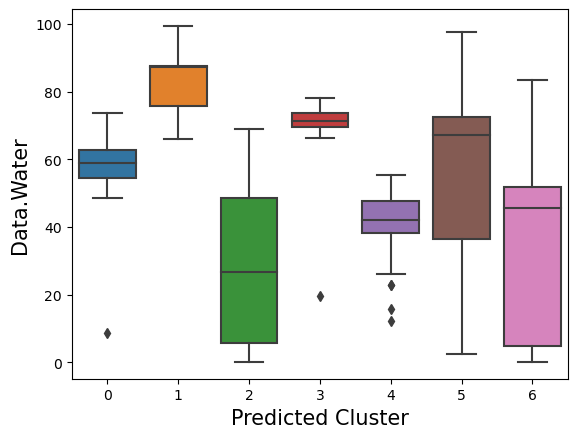

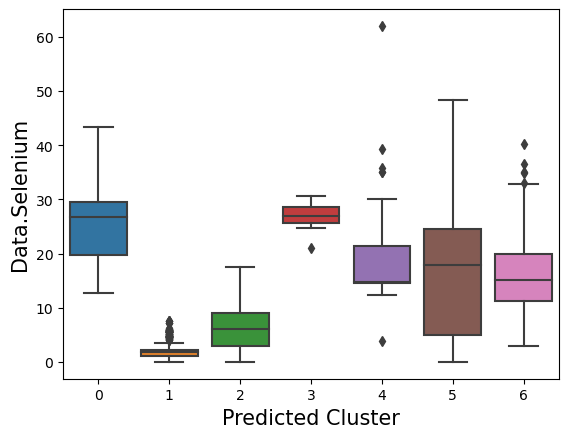

...

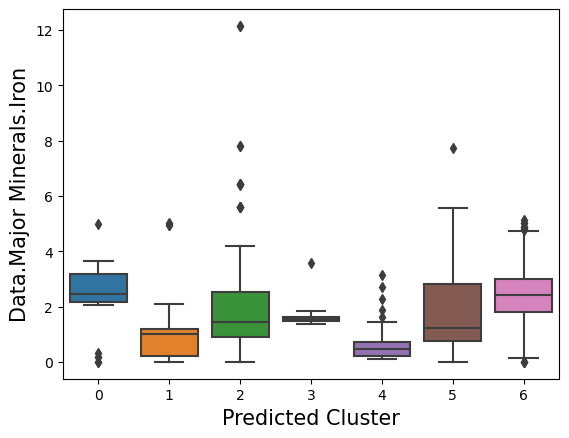

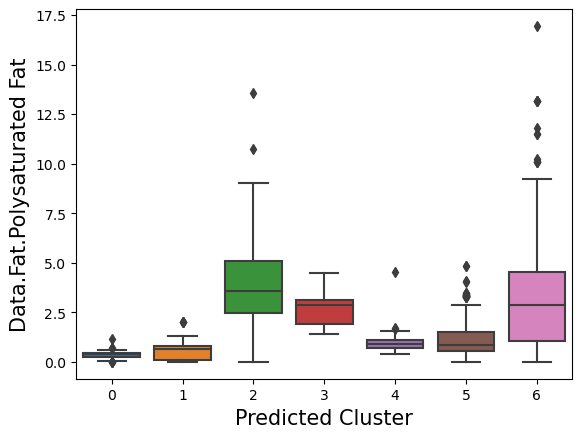

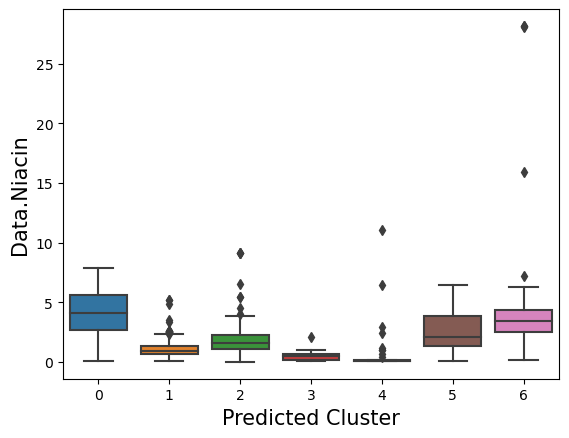

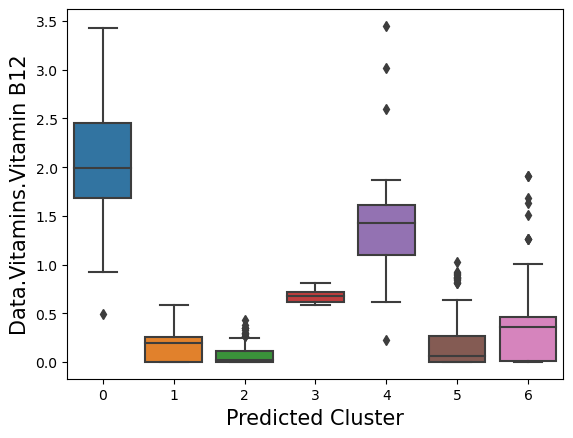

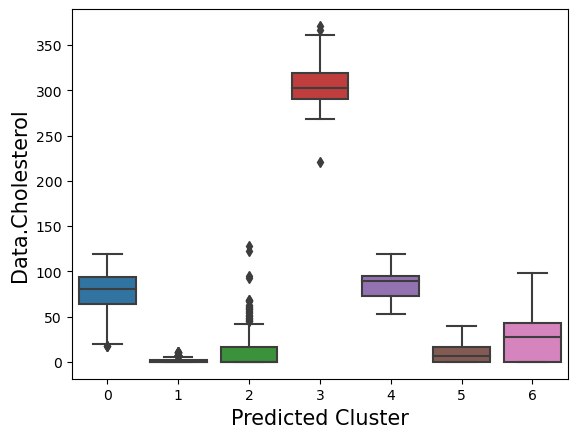

In [362]:
for col in df.iloc[:, 1:-1].columns:    #all the numeric columns in the original df
    sns.boxplot(x='predicted_cluster', y=col, data=df)
    plt.xlabel('Predicted Cluster', fontsize=15)
    plt.ylabel(col, fontsize=15)
    plt.show()

Here, with the historgam on numeric features on various Predicted Cluster Labels, we can observe that:

For <u>Riboflavin</u>, which is Vitamin B2, we can observe that most of the Clusters we have have a relatively low concentration for this (almost all below 0.5 mg), which mean be because that an overdoes of any Vitamin into the human body is not a good conduct and may lead to several undesirable outcomes. Specifically, excessive vitamin B2 intake may lead to discomfort such as skin allergies and mouth ulcers;  

Also, for <u>Niacin</u>, also known as Vitamin B3, all the clustered points have a low concentration (below 5 mg) for it. This may be becasue that Niacin mainly come from fish, poultry, fortified cereals, legumes, and breads, which the main category of our food are not consisted of;

For <u>Cluster 0</u>, it has a relatively high concentration of Vitamin B12, Major Minerals Zinc, Protein;

For <u>Cluster 1</u>, it has a really high component amount of Water and its mean concentration of it across all obersvations in Cluster 1 is pretty high, almost overlapped with the 75% percentile, indicating a probale quite left-skewed distribution of Cluster 1 with Water;

For <u>Cluster 2</u>, it has an un-usually high Polysaturated Fat component in this cluster and a pretty big spreadness cross multiple nutrients including all the Fat, Iron, and Phosphorous;

For <u>Cluster 3</u>, it has an un-usually high Cholesterol Selenium and Water component in this cluster;

For <u>Cluster 4</u>, it has an un-usually high Saturated Fat component in this cluster;

For <u>Cluster 5</u>, pretty like Cluster 1, it has a really high component amount of Water and a the mean pretty close to its Q3, indicating a probale quite left-skewed distribution of Water in this cluster;

For <u>Cluster 6</u>, it has an relatively high Polysaturated Fat component in this product across all the components, and its concentration distribution of different components all seem to have a high spreadness.

We only have 1 categorical varible: our true class label: Category. This part can be seen as working the same magic as the Adjusted Rand Score, but more detailed.

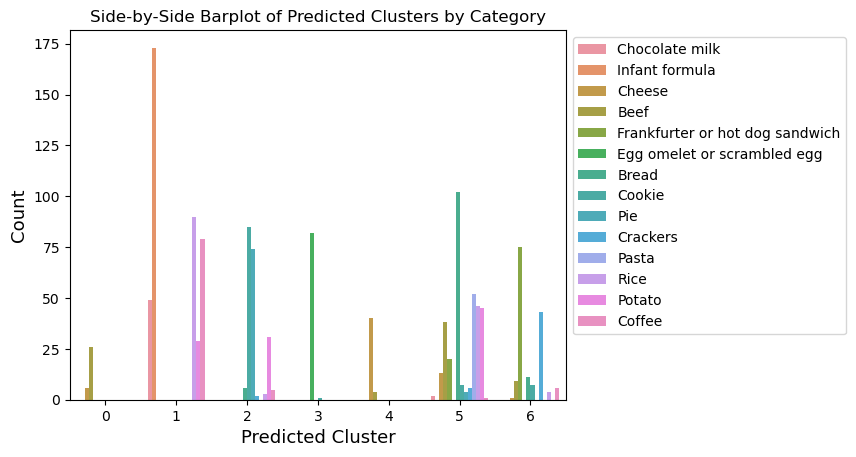

In [371]:
sns.countplot(x='predicted_cluster', hue='Category', data=df)
plt.title('Side-by-Side Barplot of Predicted Clusters by Category')
plt.xlabel('Predicted Cluster', fontsize=13)
plt.ylabel('Count', fontsize=13)
plt.legend(bbox_to_anchor=(1,1))
plt.show()

Here, with our current algotithm choice, we are mainly trying to classify 14 Food Categories into 7 clusters, and we can see from the above graph that Cluster 5 and 6 seem to comprise of around 8-10 diverse real Food Class Labels, while 1 has around 5 and 2 of around 5. This also agrees with the following TSNE plot.

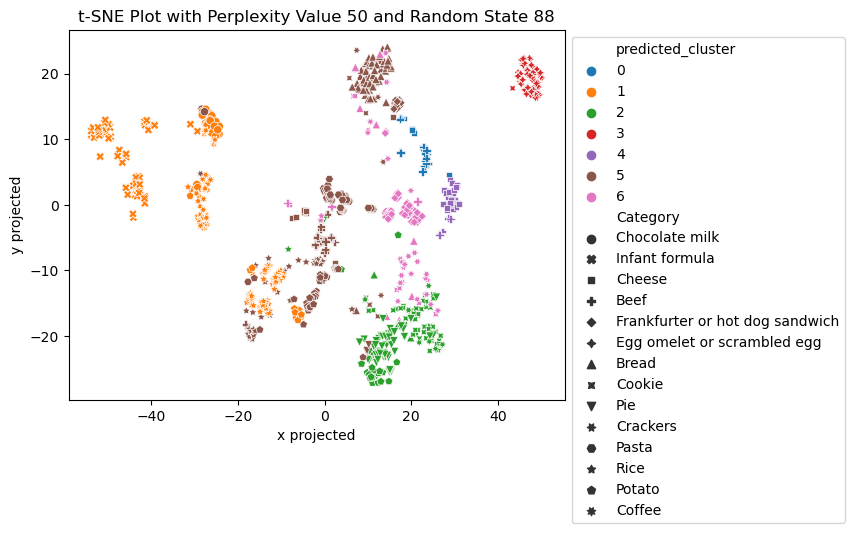

In [395]:
tsne = TSNE(n_components=2, perplexity=50, random_state=88)
data_tsne = tsne.fit_transform(X2[features2])
df_tsne = pd.DataFrame(data_tsne, columns=['x projected', 'y projected'])
comb = pd.concat([df, df_tsne], axis=1)
palette = sns.color_palette("tab10")
sns.scatterplot(x='x projected',y='y projected', hue=X2['predicted_cluster'], style=X2['Category'], data=comb, palette="tab10")
plt.title('t-SNE Plot with Perplexity Value %s and Random State %s' %(50, 88))
plt.legend(bbox_to_anchor=(1,1))
plt.show()

Now, excitingt time! Lets see if our Research Goal on Nutrient Similarity with this Cluster Algorithm of GMM was met.

In [429]:
cluster_dict = {}

for cluster_num in np.sort(df['predicted_cluster'].unique()):
    categories = np.unique(df[df['predicted_cluster']==cluster_num]['Category'].values)
    cluster_dict[cluster_num] = categories

cluster_dict

{0: array(['Beef', 'Cheese'], dtype=object),
 1: array(['Chocolate milk', 'Coffee', 'Infant formula', 'Potato', 'Rice'],
       dtype=object),
 2: array(['Bread', 'Coffee', 'Cookie', 'Crackers', 'Pie', 'Potato', 'Rice'],
       dtype=object),
 3: array(['Cookie', 'Egg omelet or scrambled egg'], dtype=object),
 4: array(['Beef', 'Cheese'], dtype=object),
 5: array(['Beef', 'Bread', 'Cheese', 'Chocolate milk', 'Coffee', 'Cookie',
        'Crackers', 'Frankfurter or hot dog sandwich', 'Pasta', 'Pie',
        'Potato', 'Rice'], dtype=object),
 6: array(['Beef', 'Bread', 'Cheese', 'Coffee', 'Cookie', 'Crackers',
        'Frankfurter or hot dog sandwich', 'Rice'], dtype=object)}

Now, with our Cluster-Category References, lets cross-exam our previous observations from Nutrients and Cluster Labels with the following distribution and see if they agree to some extent as our Goal.

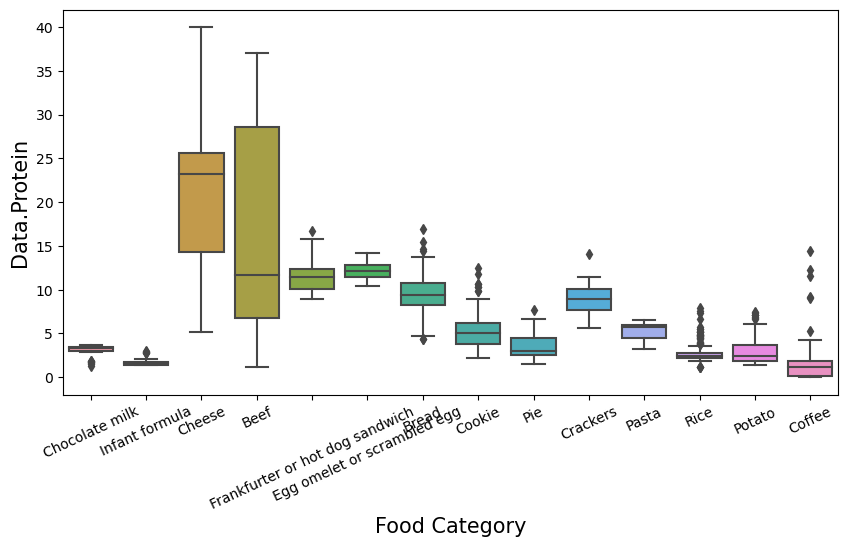

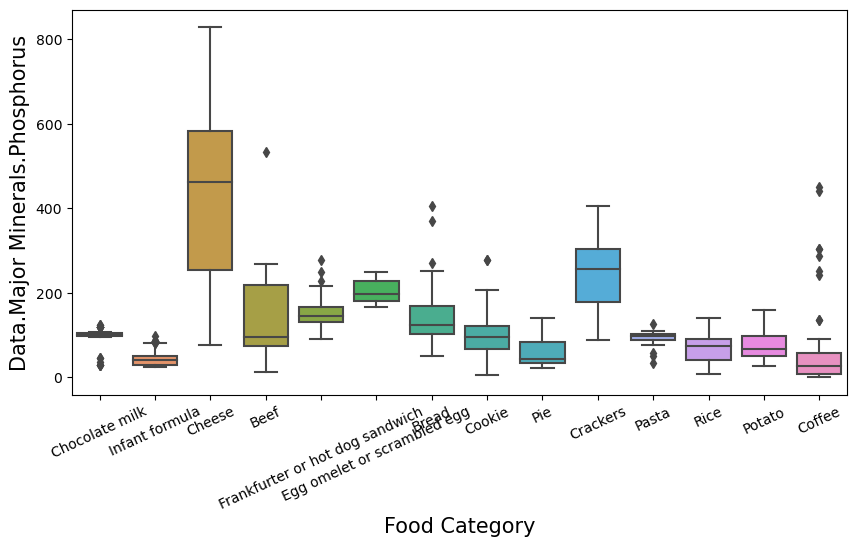

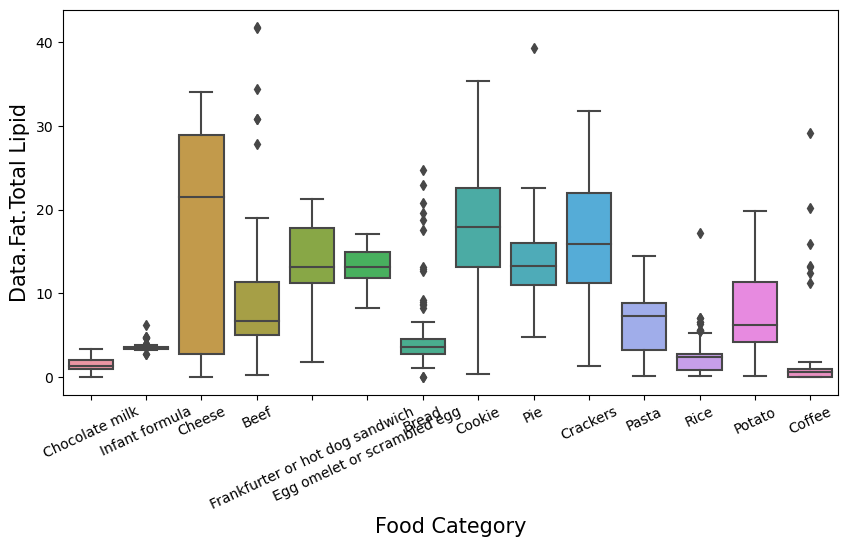

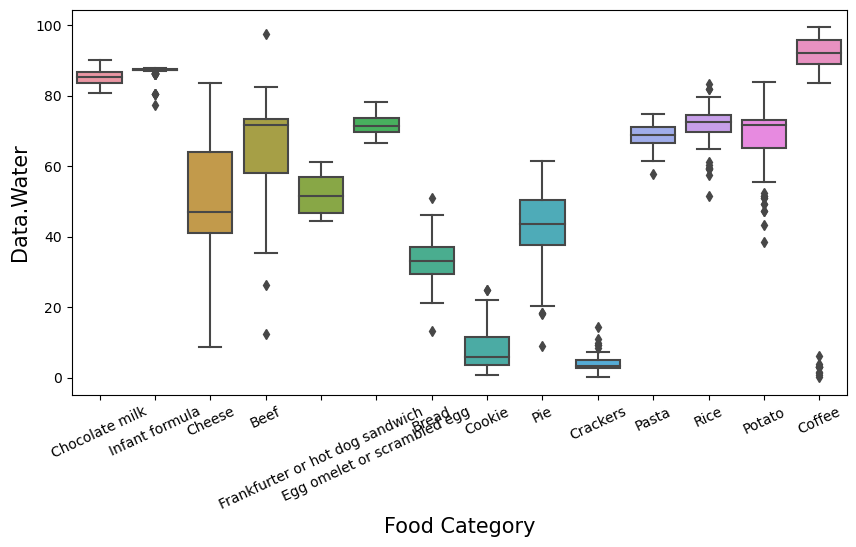

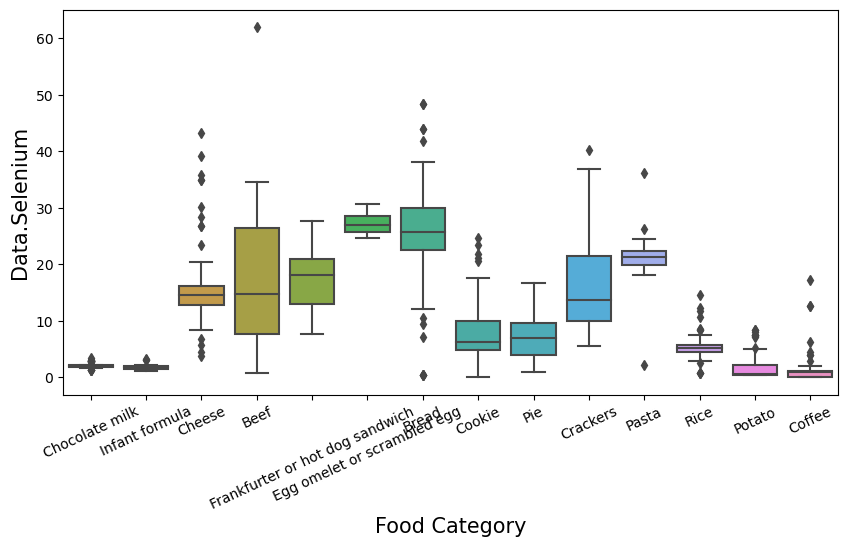

...

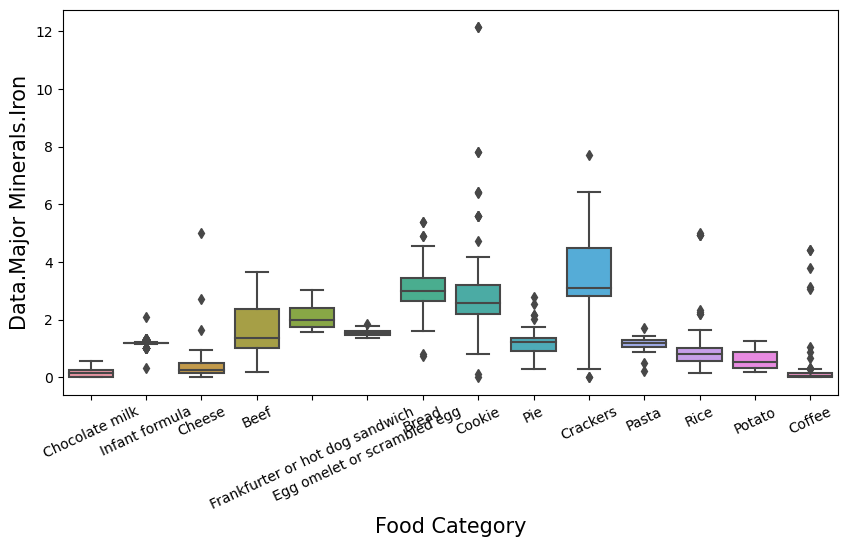

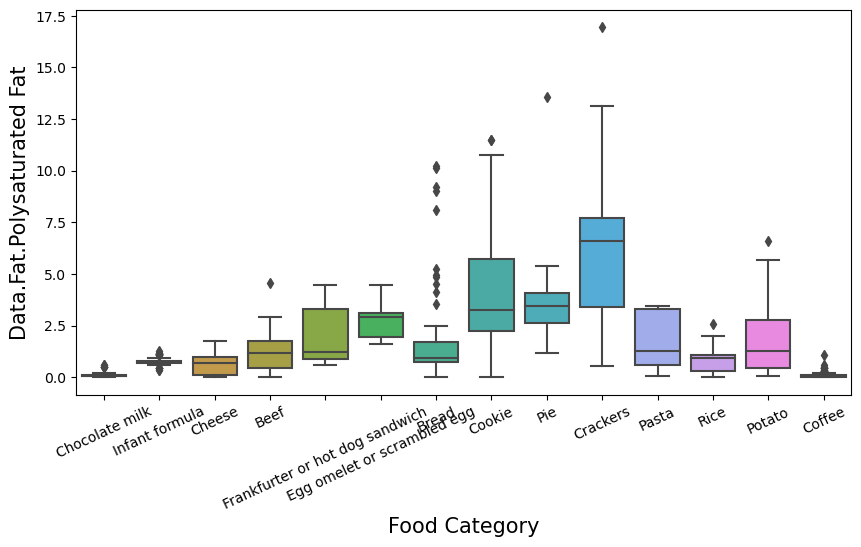

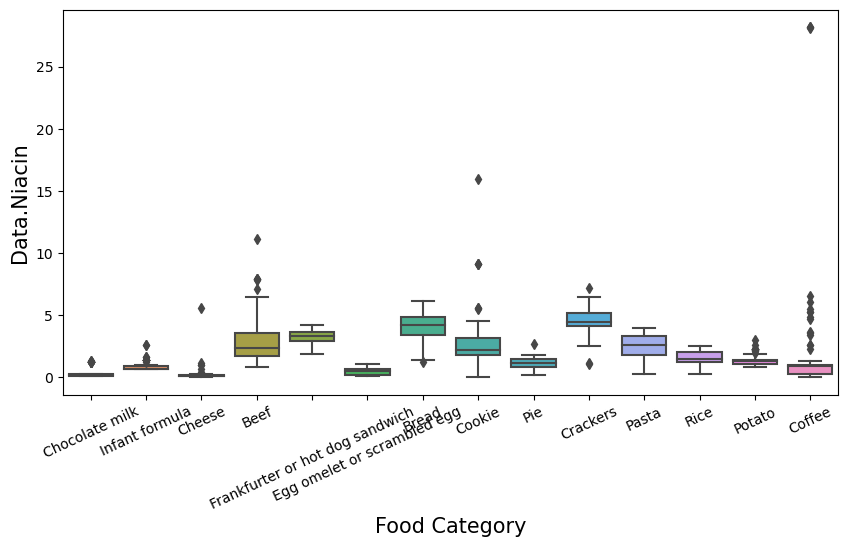

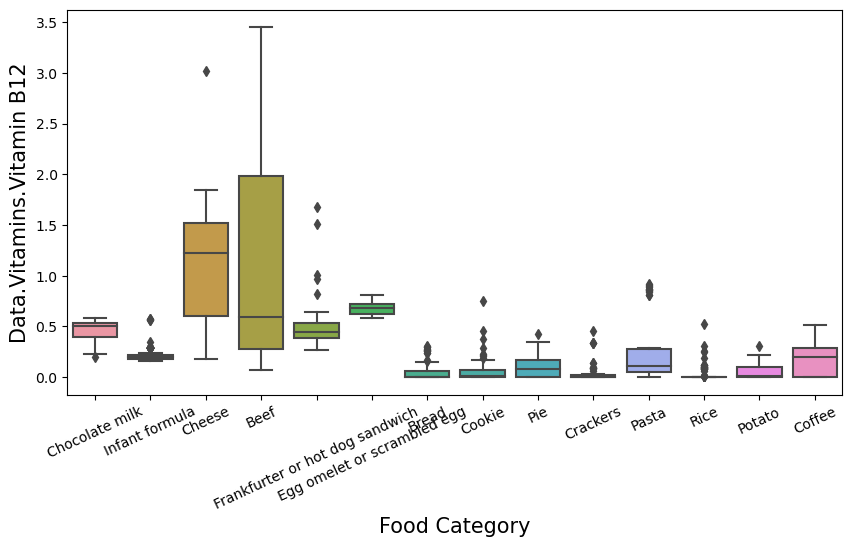

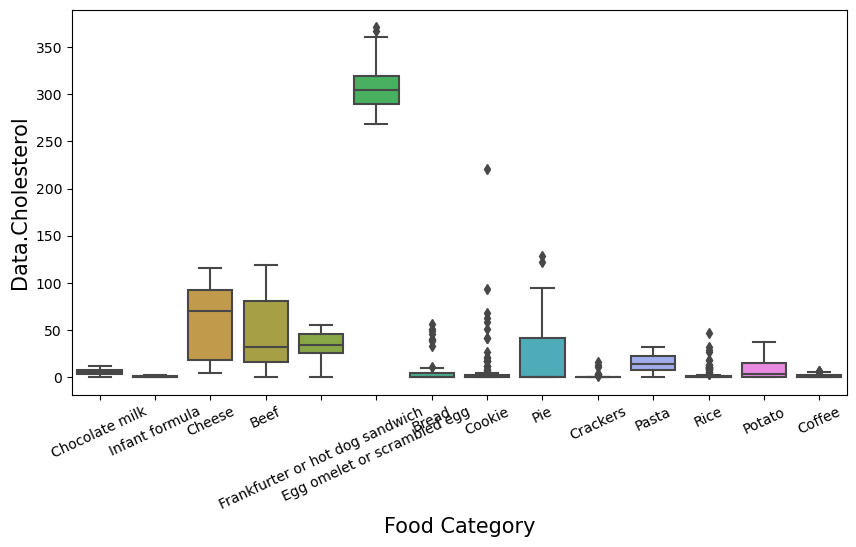

In [432]:
for col in df.iloc[:, 1:-1].columns:    #all the nutrients
    plt.figure(figsize=(10,5))
    sns.boxplot(x='Category', y=col, data=df)
    plt.xticks(rotation=25)
    plt.xlabel('Food Category', fontsize=15)
    plt.ylabel(col, fontsize=15)
    plt.show()

Cross-Exam Results:

For <u>Cluster 0: ['Beef', 'Cheese']</u>, 

it has a relatively high concentration of Vitamin B12, Major Minerals Zinc, Protein; <span style="color:GREEN">TRUE</span>

For <u>Cluster 1: ['Chocolate milk', 'Coffee', 'Infant formula', 'Potato', 'Rice']</u>, 

it has a really high component amount of Water and its mean concentration of it across all obersvations in Cluster 1 is pretty high, almost overlapped with the 75% percentile, indicating a probale quite left-skewed distribution of Cluster 1 with Water; <span style="color:GREEN">TRUE, but Infant Formula failed here</span>

For <u>Cluster 2: ['Bread', 'Coffee', 'Cookie', 'Crackers', 'Pie', 'Potato', 'Rice']</u>, 

it has an un-usually high Polysaturated Fat component in this cluster; <span style="color:GREEN">TRUE, but component amount vary a lot for food categories in this group</span>

For <u>Cluster 3: ['Cookie', 'Egg omelet or scrambled egg']</u>, 

it has an un-usually high Cholesterol, Selenium and Water component in this cluster; <span style="color:GREEN">FALSE, category Cookie failed all :(</span>

For <u>Cluster 4: ['Beef', 'Cheese']</u>, 

it has an un-usually high Saturated Fat component in this cluster; <span style="color:GREEN">TRUE, but component amount vary a lot for food categories in this group</span>

For <u>Cluster 5: ['Beef', 'Bread', 'Cheese', 'Chocolate milk', 'Coffee', 'Cookie','Crackers', 'Frankfurter or hot dog sandwich', 'Pasta', 'Pie', 'Potato', 'Rice']</u>, 
        
pretty like Cluster 1, it has a really high component amount of Water and a the mean pretty close to its Q3, indicating a probale quite left-skewed distribution of Water in this cluster; <span style="color:GREEN">Not Really Ideal, Bread, Cookie and Crackers failed with Water :(</span>

For <u>Cluster 6: ['Beef', 'Bread', 'Cheese', 'Coffee', 'Cookie', 'Crackers','Frankfurter or hot dog sandwich', 'Rice']</u>, 

it has an relatively high Polysaturated Fat component in this product across all the components, and its concentration distribution of different components all seem to have a high spreadness. <span style="color:GREEN">FALSE, Beef, Bread, Cheese, Coffee and Rice failed here :(</span>

In [437]:
len(df['Category'].value_counts().keys())

14

In [436]:
df['predicted_cluster'].unique()

array([1, 5, 4, 0, 6, 3, 2], dtype=int64)

GMM Summary:

We projected the total kinds of 14 Food Categories into 7 Clusters with a reduced number of parameters from Feature Selection to see if GMM with k=7 could tell people some shared Nutrient Component in Food Categories in one cluster. However, I observed that this does not really work with a high variation on Nutrient Components in cluster, meaning that some the Nutrient Concentration of some Food Categories in a cluster indeed match with what the cluster as a whole is indicating, while some have a really low concentration, indicating that our prediction or insights drawn from this GMM model would be either super right, or super wrong. Thus, I would not say that GMM on predicting Nutrient Concentration Similarity really worked here.   
:(

## 9. Analysis Summary and Conclusion

### 9.1. Algorithm Comparison Summary

#### 9.1.1. Comparing Algorithm Performance

#### 9.1.2. Comparing Algorithm Results

### 9.2. Conclusion and Insights Summary

GMM Summary:

We projected the total kinds of 14 Food Categories into 7 Clusters with a reduced number of parameters from Feature Selection to see if GMM with k=7 could tell people some shared Nutrient Component in Food Categories in one cluster. However, I observed that this does not really work with a high variation on Nutrient Components in cluster, meaning that some the Nutrient Concentration of some Food Categories in a cluster indeed match with what the cluster as a whole is indicating, while some have a really low concentration, indicating that our prediction or insights drawn from this GMM model would be either super right, or super wrong. Thus, I would not say that GMM on predicting Nutrient Concentration Similarity really worked here.   
:(

## 10. Group Contribution Report

Yufei Duan: Part 1-5

Tuan Tran: Part 6 + Algo1

Mengyue Huang: Part 6 + Algo2